##3D NCA##
2/27/24

Imports:

In [ ]:
# Standard imports
import numpy as np
import random
from tqdm.auto import tqdm

# TF / Keras
import tensorflow as tf
from tensorflow import keras
from keras.layers import Conv2D
from keras.layers import Concatenate
from keras import Model
from keras import Input
from keras import backend as K
from keras.layers import MaxPooling3D
from keras.layers import Conv3D

# 3D visualization
import plotly.graph_objects as graph
import matplotlib.pyplot as plt

Params:

In [ ]:
num_channels = 16

object_size = 24

Load and display functions:

In [ ]:
def ReadVoxPly(mult, fname):
  '''Reads ply files that have a header, and an array of points with x, y, z, and RGB values.
  These files were created with MagicaVoxel.
  The grid in the bunny file is on a 0.1 spacing, so mult = 10.0 for making x, y, and z integers.

  Args:
    mult: scales the x, y, and z to be integer quantities.
    fname: file to read from

  Returns:
    List of points ignoring the RGB values.
  '''
  d = [] #list to return
  with open(fname, 'r') as f:
    numvertices = -1
    while True: #look through the header and find how many points
      s = f.readline() #look at one line at a time
      slist = s.split()
      if slist[0] == "end_header":
        break #done with header
      if slist[0] == "element" and slist[1] == "vertex": #get the number of points
        numvertices = int(slist[2])
    # now read points into list
    for i in range(numvertices):
      slist = f.readline().split()
      pt = [round(mult*float(slist[0])), round(mult*float(slist[1])), round(mult*float(slist[2]))]
      d.append(pt)
  print(f"numvertices: {numvertices}")
  return d

def getptsranges(pts):
  '''
  Args:
    pts is the output of ReadVoxPly.

  Returns:
    A 2x3 array with the min and max of the x, y, and z columns.
  '''
  minc = np.min(pts, axis=0)
  maxc = np.max(pts, axis=0)
  return np.array([minc, maxc])

def maketarget3d(pts, n):
  '''Calls getptsranges to find the min and max of x, y, and z. Finds offset for centering bunny.
  Creates voxel array containing grayscale and alpha for each point.

  Args:
    pts is the output of ReadVoxPly.
    n is the object size we want. n needs to be at least as big as the bunny.

  Returns:
    Centered bunny target in voxel array with each voxel having two channels (grayscale and alpha) set to 1.0.
  '''
  rngs = getptsranges(pts)
  size = rngs[1] - rngs[0] + np.array([1,1,1]) #max - min + 1 to include both ends
  print("target object dimensions = ", size)
  if n < size[0] or n < size[1] or n < size[2]:
    raise ValueError("n must be larger than the range of coordinate values in pts")
  offset = (np.array([n, n, n]) - size) // 2 #the distance from the bunny to the edges of the box
  pts += offset #move the bunny to be centered in the box
  target = np.zeros((n,n,n,2), dtype=np.float32) #make array of voxels with 2 channels each
  for pt in pts:
    target[pt[0],pt[1],pt[2],0:2] = 1.0
  print("target array size = ",target.shape)
  return target

def loadVoxel(path):
  '''Calls ReadVoxPly to read the voxel file and get list of x, y, z points which will become voxels.
  Calls getptsranges to find the size of the target.
  Calls maketarget3d to center target in voxel array of object size.

  Returns:
    target
  '''
  print('Voxel Object Path: ',path)
  pts = ReadVoxPly(10, path)
  pts = np.array(pts, dtype=np.int32) #min and max needs np array
  rngs = getptsranges(pts)
  pts-= rngs[0]
  target_object = maketarget3d(pts, object_size)
  return target_object

def makesphere(radius, center = (0,0,0)):
  '''Fills in sphere by looking at all the points from the center in x, y, and z directions.
  If the euclidean distance of the point is within the radius from the center, then keep it.

  Args:
    radius: choose size of sphere
  Returns:
    solid sphere
  '''
  pts = []
  for xi in range(-radius, radius + 1): #fill in + and - x directions
    for yi in range(-radius, radius + 1):  #fill in + and - y directions
      for zi in range(-radius, radius + 1):  #fill in + and - z directions
        r = np.sqrt(xi**2 + yi**2 + zi**2)
        if r <= radius:
          pts.append([xi, yi, zi])
  sphere = np.array(pts)
  rngs = getptsranges(sphere)
  sphere-= rngs[0]
  return sphere

def makeseed3d(pts, n):
  '''Calls getptsranges to find the min and max of x, y, and z.
  Turns seed object into voxel array. Centers voxel around the middle of object size if not done already.

  Args:
    n is object size to build

  Returns:
    Seed that is np array of voxels with num_channels centered in object_size.
    Channels of the voxels correponding to the sphere get a value of 1.0. Voxels outside of the sphere get 0.0.
  '''
  rngs = getptsranges(pts)
  size = rngs[1] - rngs[0] + np.array([1,1,1])
  if n < size[0] or n < size[1] or n < size[2]:
    raise ValueError("n must be larger than the range of coordinate values in pts")
  offset = (np.array([n, n, n]) - size) // 2
  pts += offset
  seed = np.zeros((n,n,n,num_channels), dtype=np.float32)
  for pt in pts:
    seed[pt[0],pt[1],pt[2],0:] = 1.0
  return seed

neighbors = [[1,0,0],[-1,0,0],[0,1,0],[0,-1,0],[0,0,1],[0,0,-1]]

def findpointstohollow(vox,pt):
  '''modifies the first channel of voxels in vox in-place recursively to hollow out an object
  If on the edge, make -1
  If inside, make -2 and move outward to keep checking neighbors
  '''
  empty=[pt]
  while len(empty)>0:
    newpt = empty.pop(0)
    if vox[newpt[0],newpt[1],newpt[2],0] <= 0.0:
      continue #either outside or already hollowed
    foundzero = False

    for n in neighbors:
      outpt = newpt+n
      if vox[outpt[0],outpt[1],outpt[2],0] == 0.0: #if its on the edge (if it has a neighbor outside)
        vox[newpt[0],newpt[1],newpt[2],0] = -1.0
        foundzero = True
        break #break out of for loop
    if not foundzero:
      vox[newpt[0],newpt[1],newpt[2],0] = -2.0
      for n in neighbors:
        empty.append(newpt+n)

def makehollow(vox):
  '''Calls findpointstohollow on a voxel object to find the points inside.
  makehollowr will set voxels to -2.0 if inside, -1.0 if on surface, and leave points outside 0.0.
  makehollow then turns all the surface voxels to 1.0 and makes everything else 0.0.
  Returns:
    voxel object array with the same shape but hollowed out.
  '''
  center = np.array(vox.shape)//2
  center=center[:3]
  findpointstohollow(vox, center) #assume that the center of the array is inside the object
  for xi in range(vox.shape[0]):
    for yi in range(vox.shape[1]):
      for zi in range(vox.shape[2]):
        if vox[xi,yi,zi,0] == -1.0:
          vox[xi,yi,zi,0:] = 1.0
        else:
          vox[xi,yi,zi,0:] = 0.0

def makefull(vox,pt):
  '''
  Returns filled in voxel object array
  '''
  fill=[pt]
  while len(fill)>0:
    newpt=fill.pop(0)
    if vox[newpt[0],newpt[1],newpt[2],0] != 0.0:
      continue
    vox[newpt[0],newpt[1],newpt[2],0:] = 1.0
    for n in neighbors:
      fill.append(newpt+n)

In [ ]:
def visualize_3d_grid(target):
  '''Used to visualize the object after training has finished.
  Fills in points that have color, ignoring the rest.
  Makes a plotly.graph_objects plot of size object_size.
  '''
  points = np.argwhere(target[0,:,:,:,0] != 0)
  x, y, z = points[:,0], points[:,1], points[:,2]

  fig = graph.Figure(data=[graph.Scatter3d(x=x, y=y, z=z,
                                      mode='markers')])

  fig.update_layout(scene=dict(
                        xaxis_title='X',
                        yaxis_title='Y',
                        zaxis_title='Z',
                        xaxis = dict(range = [0,object_size]),
                        yaxis = dict(range = [0,object_size]),
                        zaxis = dict(range = [0,object_size])),
                    scene_camera=dict(
                        up=dict(x=0, y=0, z=1),
                        center=dict(x=0, y=0, z=0),
                        eye=dict(x=-2, y=2, z=1.5)))  # Set camera position
  fig.show()

def visualize_3d_grid_non_interactive(target):
  '''Used to visualize the object during training.
  Fills in points that have color, ignoring the rest.
  Makes a matplotlib plot of size object_size.
  '''
  points = np.argwhere(target[0,:,:,:,0] != 0)
  x, y, z = points[:, 0], points[:, 1], points[:, 2]

  fig = plt.figure()

  ax = fig.add_subplot(111, projection='3d',)
  ax.scatter(x, y, z)

  ax.set_xlim(0, object_size)
  ax.set_ylim(0, object_size)
  ax.set_zlim(0, object_size)
  ax.set_xlabel('X')
  ax.set_ylabel('Y')
  ax.set_zlabel('Z')

  plt.show()

Set the voxel file:

In [ ]:
target_object = loadVoxel("/content/BunnyMedium.vox-0-bun_zipper_res4.ply")
padding = (object_size - target_object.shape[0])//2
target_object[12,12,12,0]

# num_channels is the vector length in each cell

Voxel Object Path:  /content/BunnyMedium.vox-0-bun_zipper_res4.ply
numvertices: 5952
target object dimensions =  [21 16 21]
target array size =  (24, 24, 24, 2)


0.0

Make hollow sphere

In [ ]:
sphere = makeseed3d(makesphere(5),object_size)
hollowsphere = sphere.copy()
makehollow(hollowsphere)

Make bunny fully hollow (fill first then hollow out)

In [ ]:
fullbunny = target_object.copy()
center=np.array(fullbunny.shape)[0:3]//2
makefull(fullbunny,center)

In [ ]:
hollowbunny = fullbunny.copy()
makehollow(hollowbunny)

Display the seed:

In [ ]:
visualize_3d_grid(np.array([hollowsphere]))

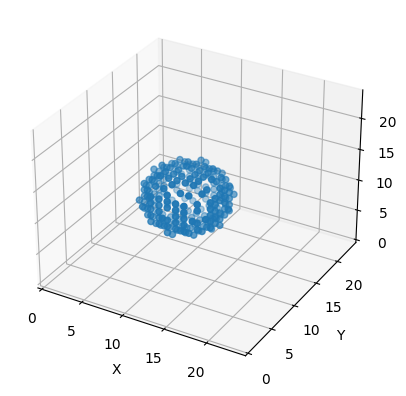

In [ ]:
visualize_3d_grid_non_interactive(np.array([hollowsphere]))

Display the target object

In [ ]:
visualize_3d_grid(np.array([hollowbunny]))

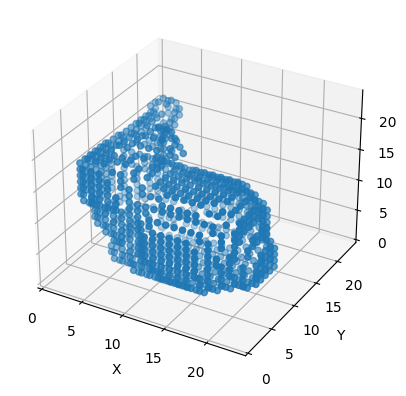

In [ ]:
visualize_3d_grid_non_interactive(np.array([hollowbunny]))

We use MSE as our loss function

In [ ]:
def calc_loss(y_true, y_pred):
  """MSE between the first 2 channels of the current and target state

  Args:
    y_true, y_pred: TF tensors that contain the grayscale and alpha channel values for each pixel
  Returns:
    MSE Loss
  """
  loss = tf.reduce_mean(tf.square(y_true[...,0:2] - y_pred[...,0:2]))
  return loss

In [ ]:
class CA():

  def __init__(self, target_object, seed_type = 'sphere'):
    self.update_count = 0
    #print(target_object.shape)
    self.padded_target = self.pad_target(target_object)
    #print(self.padded_target.shape)
    self.model = model_step
    self.opt = opt
    self.seed_type = seed_type
    self.set_seed()
    # dummy evaluation so model is completely initialized
    self.apply_model_step(self.state_grid)
    print("Seed Shape = ",self.state_grid.shape)
    print("Target Shape = ",self.padded_target.shape)
    print("Seed and target initialized")


  def set_seed(self):
    """initializes what starting seed to grow from. Defaults to 'sphere'.
    """
    if self.seed_type == 'sphere':
      self.state_grid = np.array([sphere])
    if self.seed_type == 'hollowsphere':
      self.state_grid = np.array([hollowsphere])
    #need to make a hollow sphere option

  def pad_target(self, target):
    return np.array([target_object])

  @tf.function
  def get_living_mask(self, x):
    """Determines living state of a cell given state of neighbors

    Args:
      x: the current state for all the cells
    Returns:
      boolean array indicating if a cell should be considered alive or dead
    """
    alpha = x[..., 1:2]
    alive = MaxPooling3D(pool_size=(3,3,3),strides=1, padding='same')(alpha)
    return K.cast(alive > 0.1,dtype='int32')

  def display_current_state(self, current_grid):
    visualize_3d_grid_non_interactive(current_grid)

  def grow(self, nsteps):
    """Display growth from seed to target

    Args:
      nsteps: grow for this many steps
    """
    self.set_seed()
    x = self.state_grid
    step = 1
    self.display_current_state(self.state_grid)
    for i in range(nsteps):
      print("Time step ", step)
      x = self.apply_model_step(x)
      self.display_current_state(x)
      step += 1
    loss = calc_loss(self.padded_target, x)
    print("Current Loss: ", tf.get_static_value(loss))

  @tf.function
  def apply_model_step(self, input_obj):
    """apply_model_step takes one time step forward in the RNN by calling the
     Sobel filters and passes the concatenated output into the Conv3D layers.
     The delta produced by the model is added to the state_grid if that specific
     cell is alive both before and after the update.

    Args:
      input_obj: current state of the grid
    Returns:
      The updated state_grid
    """
    alive_before_update = self.get_living_mask(input_obj)
    delta = self.model(input_obj)
    new_obj = input_obj + delta
    still_living = self.get_living_mask(new_obj)
    live = K.cast(alive_before_update&still_living, tf.float32)
    return new_obj * live

  @tf.function
  def train_step(self, input_obj):
    """train_step calculates the gradients for an RNN of length RNN_length.
    train_step is called by train to be repeated ntimes. tf.Gradient tape watches all the weights
    and treats them as variables for backpropagation. g.gradient calculates the gradient vectors after
    the end of the RNN loop. The gradients are then normalized before the weights are updated.

    Args:
      input_obj: current state of the grid
    Returns:
      The new state_grid and the loss
    """
    RNN_length = 10
    x = input_obj
    with tf.GradientTape() as g:
      for i in range(RNN_length):
        x = self.apply_model_step(x)
      loss = calc_loss(self.padded_target, x)
    grads = g.gradient(loss, self.model.trainable_weights)
    grads = [grad / (tf.norm(grad) + 1e-8) for grad in grads]
    self.opt.apply_gradients(zip(grads, self.model.trainable_weights))
    return x, loss

  def train(self, ntimes):
    """trains an emoji model's weights ntimes by calling train_step on the starting seed.
    Displays the current training step, loss, and training time.

    Args:
      ntimes: trains the model n times
    """
    print("Training Steps Completed: " + str(self.update_count))
    for i in tqdm(range(ntimes)):
      self.set_seed()
      new_grid,loss = self.train_step(self.state_grid)
      self.update_count += 1
      self.state_grid = new_grid
      print("Training Steps Completed: " + str(self.update_count))
      print("Loss:"), tf.print(loss)
      self.display_current_state(self.state_grid)
    return

1. Create new model:

In [ ]:
from keras.optimizers.schedules import PiecewiseConstantDecay
from keras.optimizers.schedules import ExponentialDecay

sobelx_3Dkernel = np.zeros((3,3,3,num_channels),dtype=np.float32)
sobely_3Dkernel = np.zeros((3,3,3,num_channels),dtype=np.float32)
sobelz_3Dkernel = np.zeros((3,3,3,num_channels),dtype=np.float32)
laplacian19_3Dkernel = np.zeros((3,3,3,num_channels),dtype=np.float32)
laplacian27_3Dkernel = np.zeros((3,3,3,num_channels),dtype=np.float32)


sobelx_3Dkernel_1c = np.array([[[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]],
                                     [[-2, 0, 2], [-4, 0, 4], [-2, 0, 2]],
                                     [[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]],dtype=np.float32)

sobely_3Dkernel_1c = np.array([[[-1, -2, -1], [0, 0, 0], [1, 2, 1]],
                                     [[-2, -4, -2], [0, 0, 0], [2, 4, 2]],
                                     [[-1, 2, -1], [0, 0, 0], [1, 2, 1]]],dtype=np.float32)

sobelz_3Dkernel_1c = np.array([[[-1, -2, -1], [-2, -4, -2], [-1, -2, -1]],
                                     [[0, 0, 0], [0, 0, 0], [0, 0, 0]],
                                     [[1, 2, 1], [2, 4, 2], [1, 2, 1]]],dtype=np.float32)

laplacian27_3Dkernel_1c = np.array([[[1/3, 1/2, 1/3], [1/2, 1, 1/2], [1/3, 1/2, 1/3]],
                                     [[1/2, 1, 1/2], [1, -44/3, 1], [1/2, 1, 1/2]],
                                     [[1/3, 1/2, 1/3], [1/2, 1, 1/2], [1/3, 1/2, 1/3]]],dtype=np.float32)

laplacian27_3Dkernel_1c=laplacian27_3Dkernel_1c*(3/13)

laplacian19_3Dkernel_1c = np.zeros((3,3,3),dtype=np.float32)

def set_l(pt,v):
  global laplacian19_3Dkernel_1c
  laplacian19_3Dkernel_1c[pt[0]+1,pt[1]+1,pt[2]+1]=v

set_l([0,0,0],-24)
faces= [[0,0,1],[0,1,0], [1,0,0], [0,0,-1], [0,-1,0], [-1,0,0]]
for c in faces:
  set_l(c,2)

edges = [[-1,1,0],[1,1,0],[-1,-1,0], [1,-1,0],[-1,0,1],[1,0,1], [-1,0,-1], [1,0,-1],
  [0,1,1], [0,1,-1], [0,-1,-1], [0,-1,1]]

for e in edges:
  set_l(e,1)

print(laplacian19_3Dkernel_1c)

obj = Input(shape = (object_size, object_size, object_size, num_channels))

for i in range(num_channels):
    sobelx_3Dkernel[..., i] = sobelx_3Dkernel_1c
    sobely_3Dkernel[..., i] = sobely_3Dkernel_1c
    sobelz_3Dkernel[..., i] = sobelz_3Dkernel_1c
    laplacian27_3Dkernel[...,i] = laplacian27_3Dkernel_1c
    laplacian19_3Dkernel[...,i] = laplacian19_3Dkernel_1c


def Sobelx_init(shape, dtype=None):
  return sobelx_3Dkernel.reshape(shape)

def Sobely_init(shape, dtype=None):
  return sobely_3Dkernel.reshape(shape)

def Sobelz_init(shape, dtype=None):
  return sobelz_3Dkernel.reshape(shape)

def Laplacian19_init(shape, dtype=None):
  return laplacian19_3Dkernel.reshape(shape)

def Laplacian27_init(shape, dtype=None):
  return laplacian27_3Dkernel.reshape(shape)


sobelx_3Dlayer = Conv3D(filters=num_channels,kernel_size=3,activation=None,kernel_initializer=Sobelx_init,use_bias=False,groups=num_channels,padding='SAME',trainable=False)(obj)
sobely_3Dlayer = Conv3D(filters=num_channels,kernel_size=3,activation=None,kernel_initializer=Sobely_init,use_bias=False,groups=num_channels,padding='SAME',trainable=False)(obj)
sobelz_3Dlayer = Conv3D(filters=num_channels,kernel_size=3,activation=None,kernel_initializer=Sobelz_init,use_bias=False,groups=num_channels,padding='SAME',trainable=False)(obj)
laplacian27_3Dlayer = Conv3D(filters=num_channels,kernel_size=3,activation=None,kernel_initializer=Laplacian27_init,use_bias=False,groups=num_channels,padding='SAME',trainable=False)(obj)
laplacian19_3Dlayer = Conv3D(filters=num_channels,kernel_size=3,activation=None,kernel_initializer=Laplacian19_init,use_bias=False,groups=num_channels,padding='SAME',trainable=False)(obj)

concat = Concatenate(axis=-1)([sobelx_3Dlayer, sobely_3Dlayer, sobelz_3Dlayer, laplacian27_3Dlayer, obj])#,axis=-1)

Conv1 = Conv3D(128, 3, activation = 'relu',use_bias=False,bias_initializer = 'zeros',padding="SAME")(concat)
Conv2 = Conv3D(16, 1, activation = None, kernel_initializer = 'zeros',bias_initializer = 'zeros')(Conv1)
model_step = Model(obj, Conv2)
model_step.summary()

lr = .001
lr_sched = tf.keras.optimizers.schedules.ExponentialDecay(lr, 50, 0.9)
#lr_sched = tf.keras.optimizers.schedules.PiecewiseConstantDecay([2000], [lr,lr*.01])
opt = tf.keras.optimizers.Adam(lr_sched)

[[[  0.   1.   0.]
  [  1.   2.   1.]
  [  0.   1.   0.]]

 [[  1.   2.   1.]
  [  2. -24.   2.]
  [  1.   2.   1.]]

 [[  0.   1.   0.]
  [  1.   2.   1.]
  [  0.   1.   0.]]]
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 24, 24, 24, 16)]     0         []                            
                                                                                                  
 conv3d (Conv3D)             (None, 24, 24, 24, 16)       432       ['input_1[0][0]']             
                                                                                                  
 conv3d_1 (Conv3D)           (None, 24, 24, 24, 16)       432       ['input_1[0][0]']             
                                                                                                  
 conv3d_2 (Conv3

Visualize model:

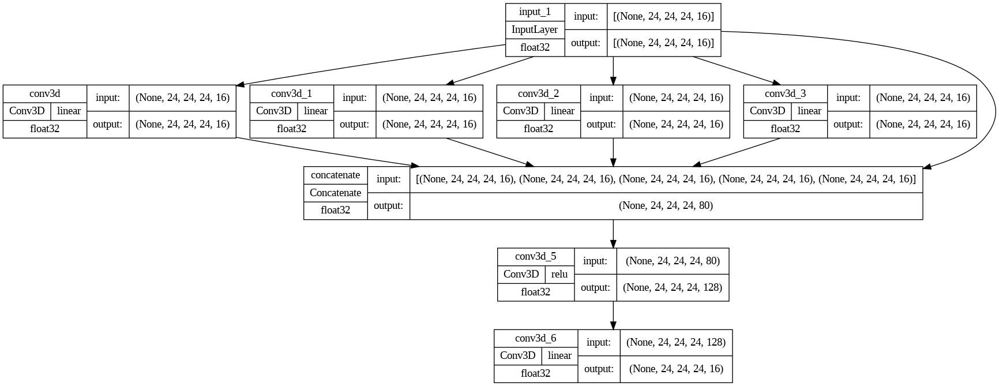

In [ ]:
keras.utils.plot_model(model_step,show_shapes=True,show_dtype=True,show_layer_activations=True)

2. Initialize:

In [ ]:
grid = CA(hollowbunny,"hollowsphere")

Seed Shape =  (1, 24, 24, 24, 16)
Target Shape =  (1, 24, 24, 24, 2)
Seed and target initialized


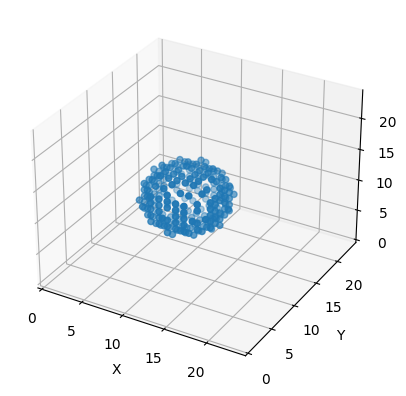

Time step  1


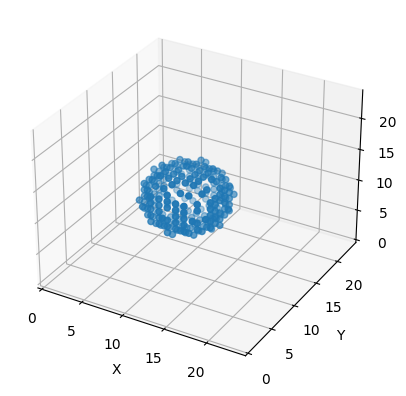

Time step  2


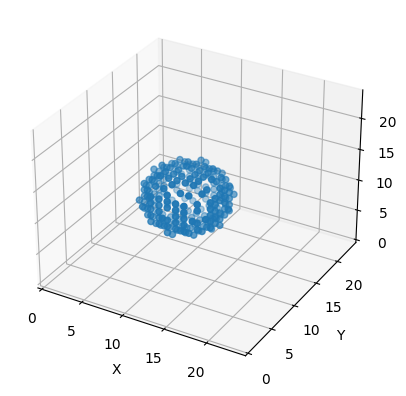

Time step  3


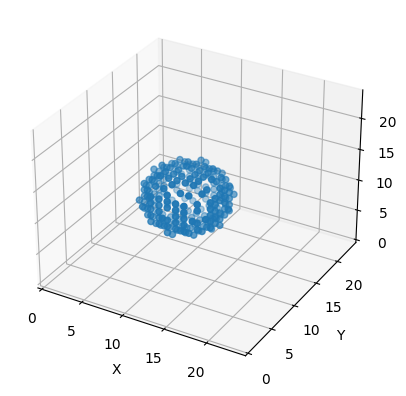

Time step  4


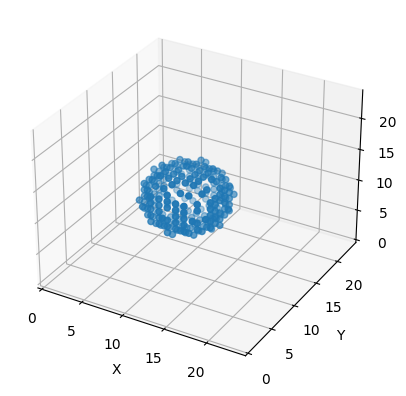

Time step  5


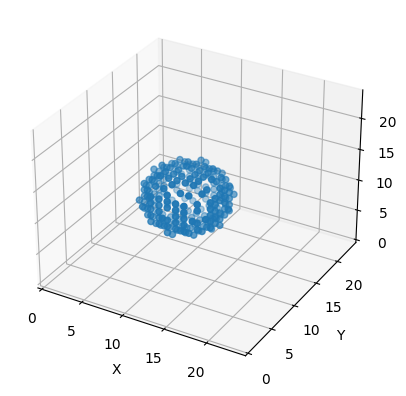

Time step  6


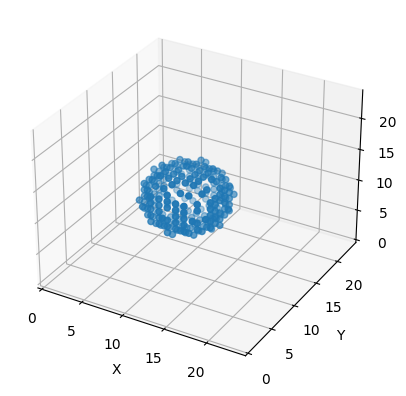

Time step  7


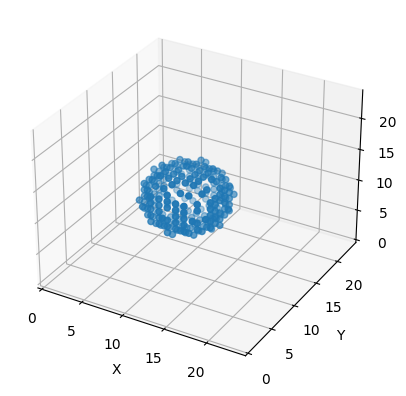

Time step  8


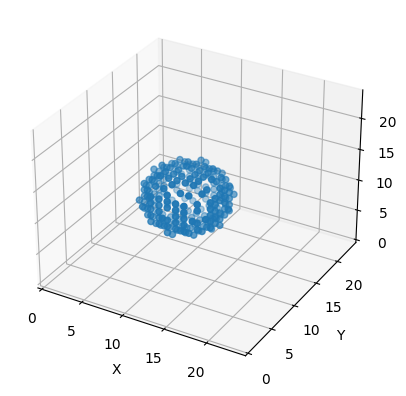

Time step  9


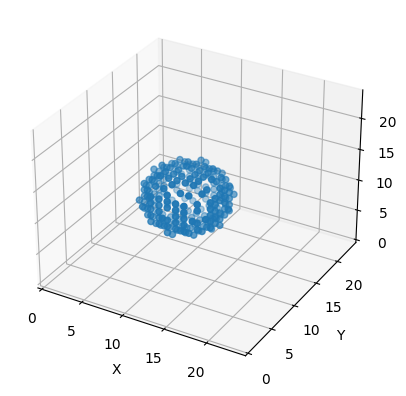

Time step  10


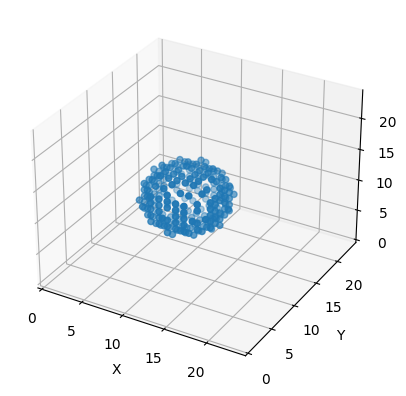

Current Loss:  0.116681136


In [ ]:
grid.grow(10)

Training Steps Completed: 0


  0%|          | 0/200 [00:00<?, ?it/s]

Training Steps Completed: 1
Loss:
0.116681136


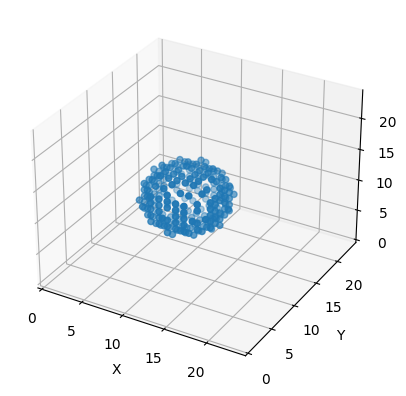

Training Steps Completed: 2
Loss:
0.129708037


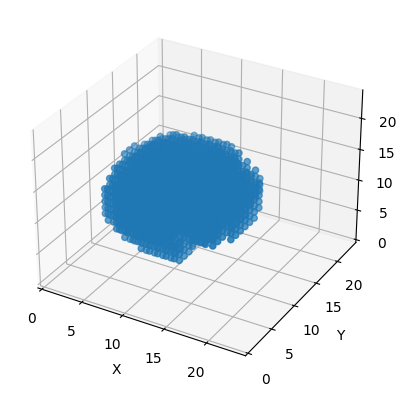

Training Steps Completed: 3
Loss:
0.149001971


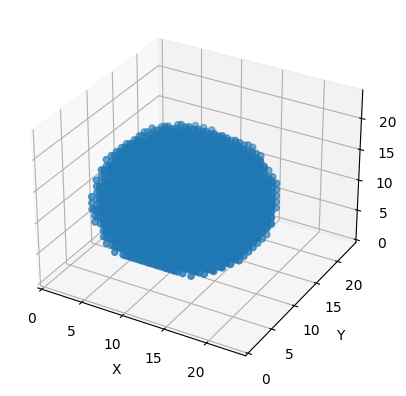

Training Steps Completed: 4
Loss:
0.104648359


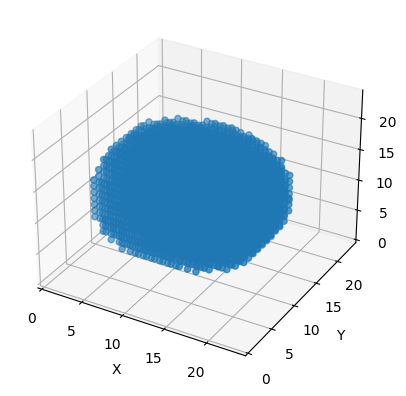

Training Steps Completed: 5
Loss:
0.0940701663


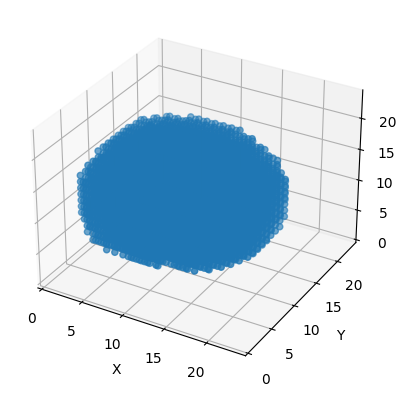

Training Steps Completed: 6
Loss:
0.091228731


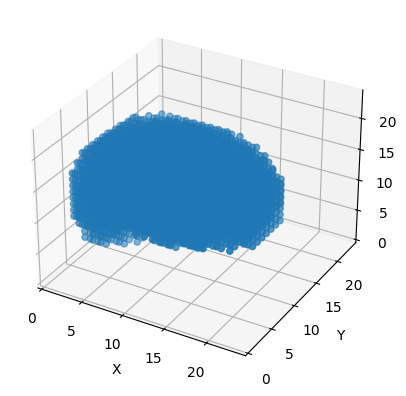

Training Steps Completed: 7
Loss:
0.0988085568


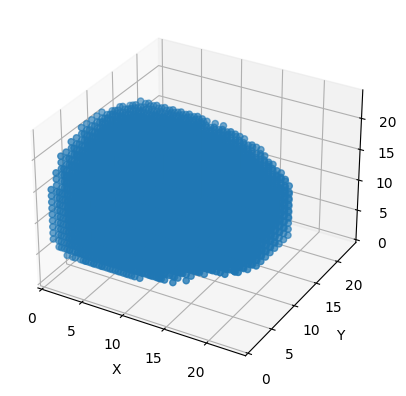

Training Steps Completed: 8
Loss:
0.0815182552


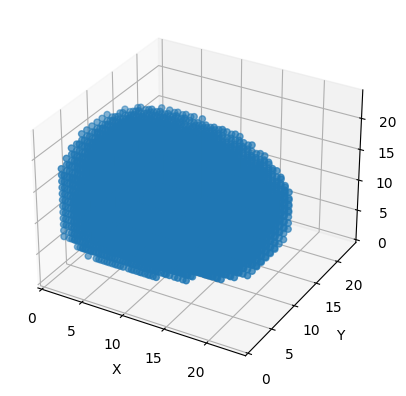

Training Steps Completed: 9
Loss:
0.0859269202


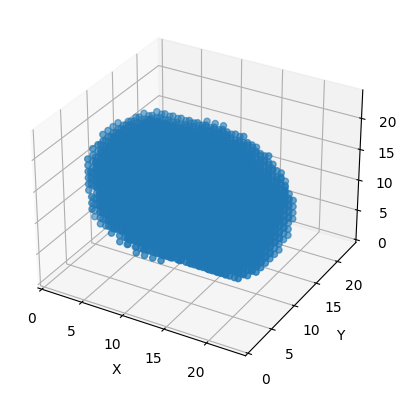

Training Steps Completed: 10
Loss:
0.0807139799


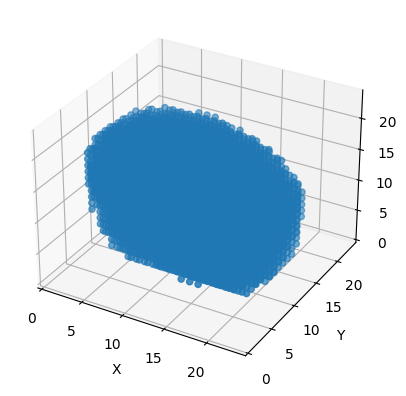

Training Steps Completed: 11
Loss:
0.0722743571


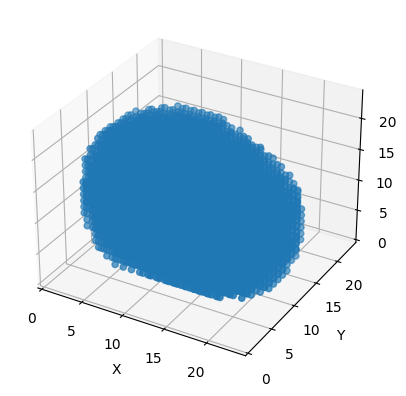

Training Steps Completed: 12
Loss:
0.0643062443


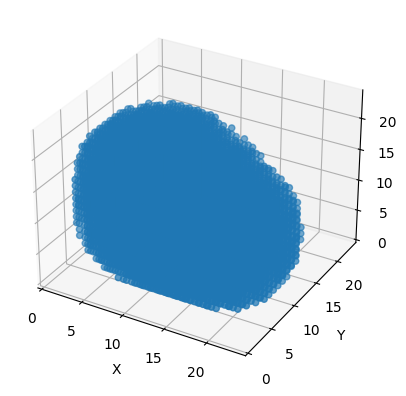

Training Steps Completed: 13
Loss:
0.0646852627


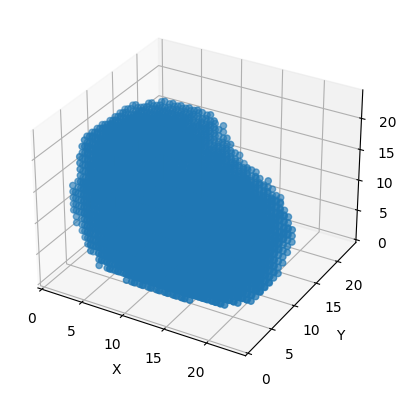

Training Steps Completed: 14
Loss:
0.0675599128


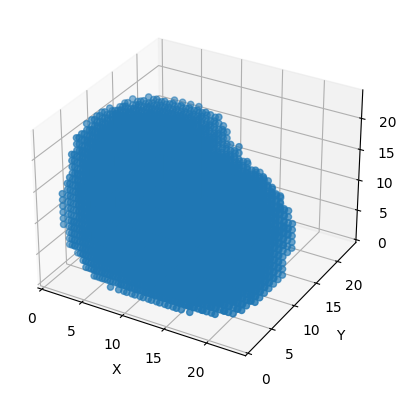

Training Steps Completed: 15
Loss:
0.0582208633


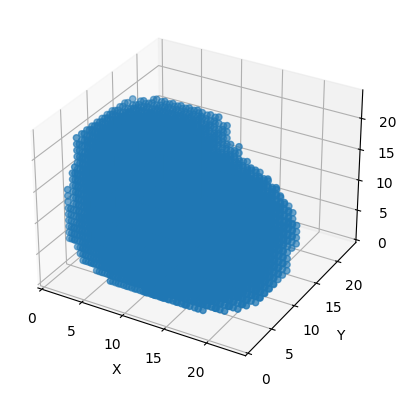

Training Steps Completed: 16
Loss:
0.0551484786


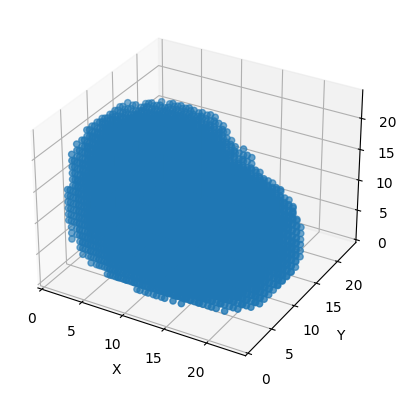

Training Steps Completed: 17
Loss:
0.0551070906


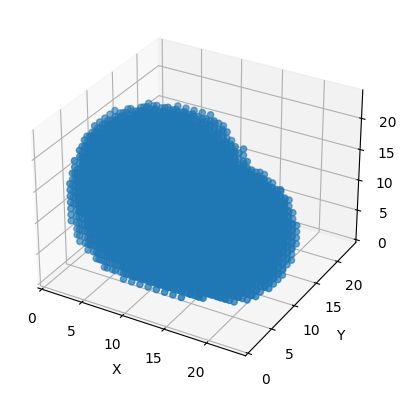

Training Steps Completed: 18
Loss:
0.0567199402


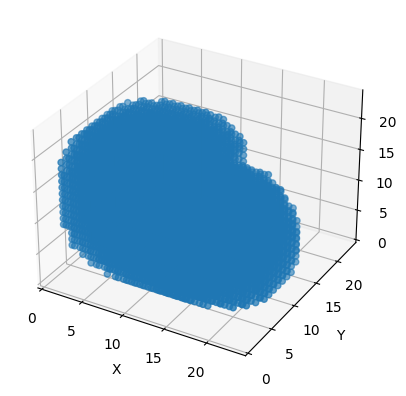

Training Steps Completed: 19
Loss:
0.050661318


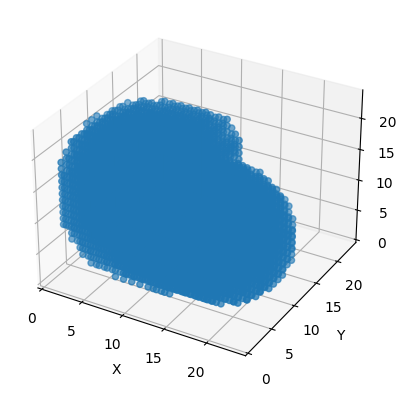

Training Steps Completed: 20
Loss:
0.0634759292


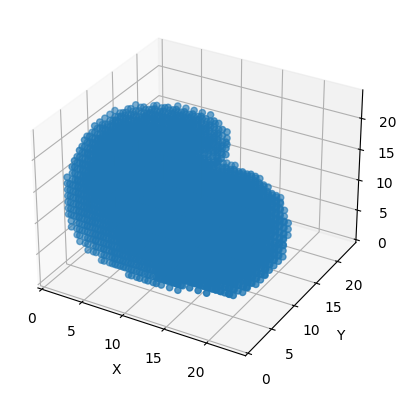

Training Steps Completed: 21
Loss:
0.061217498


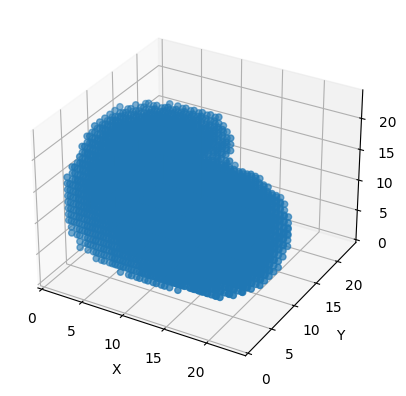

Training Steps Completed: 22
Loss:
0.0541991219


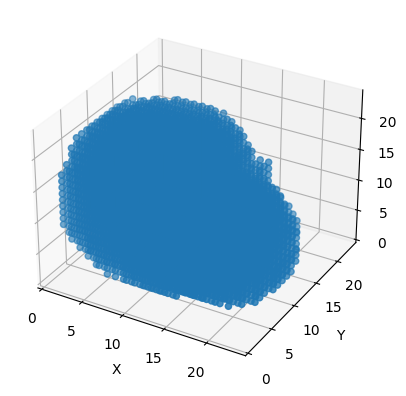

Training Steps Completed: 23
Loss:
0.0568997413


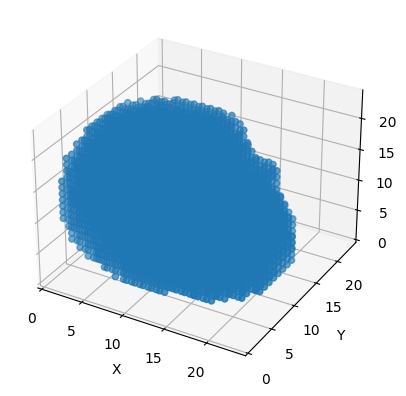

Training Steps Completed: 24
Loss:
0.0536716767


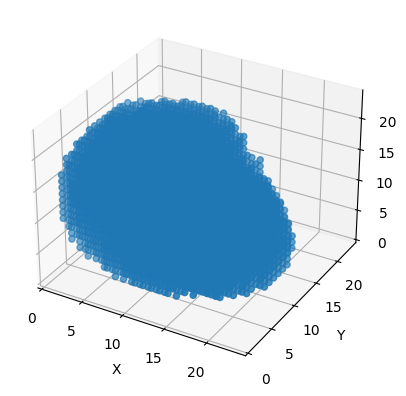

Training Steps Completed: 25
Loss:
0.0469272844


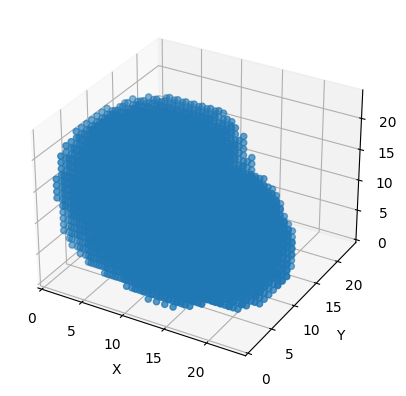

Training Steps Completed: 26
Loss:
0.0431703888


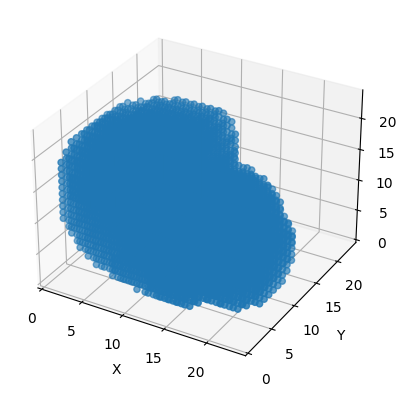

Training Steps Completed: 27
Loss:
0.0405402705


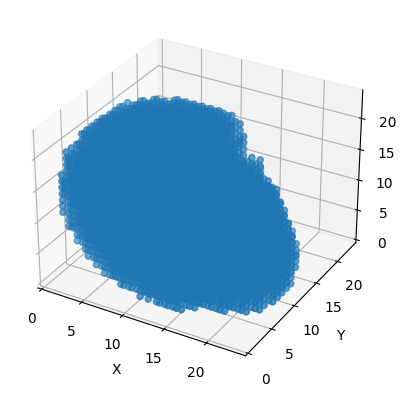

Training Steps Completed: 28
Loss:
0.0457727946


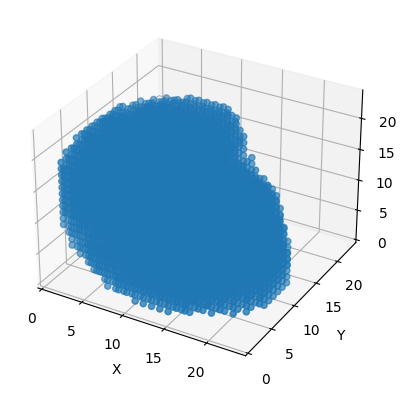

Training Steps Completed: 29
Loss:
0.042073369


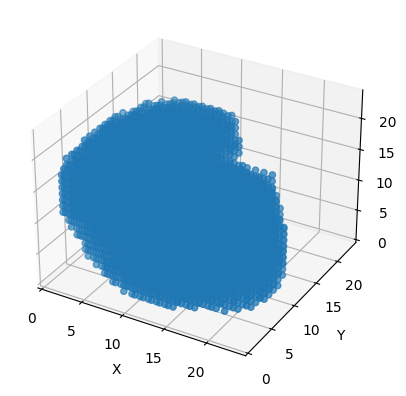

Training Steps Completed: 30
Loss:
0.0454964638


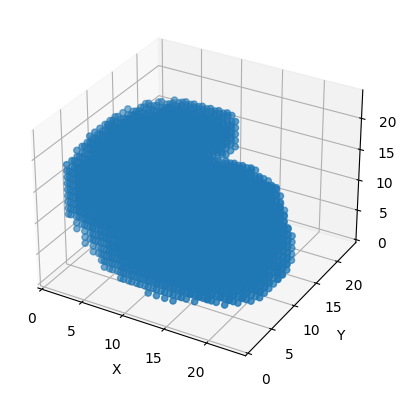

Training Steps Completed: 31
Loss:
0.0488856584


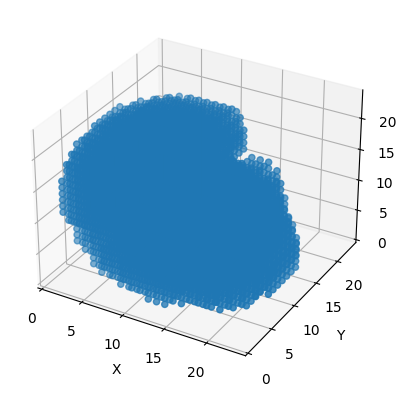

Training Steps Completed: 32
Loss:
0.03762367


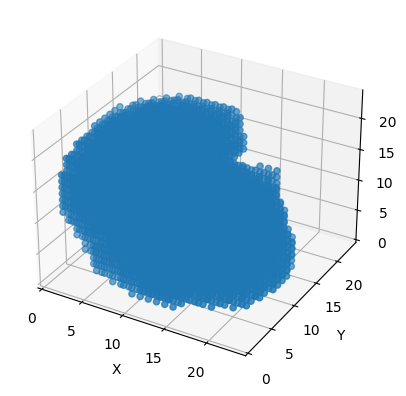

Training Steps Completed: 33
Loss:
0.0382542871


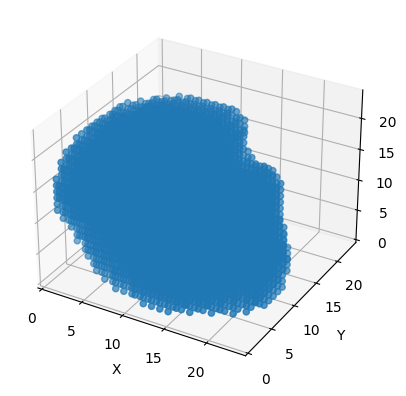

Training Steps Completed: 34
Loss:
0.0384356044


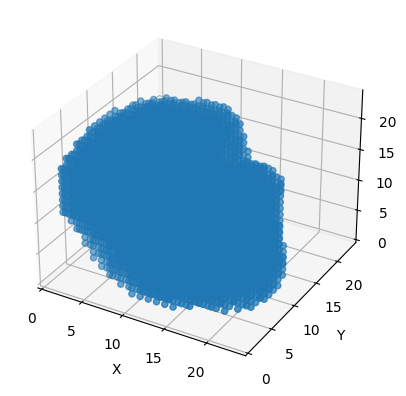

Training Steps Completed: 35
Loss:
0.0377964899


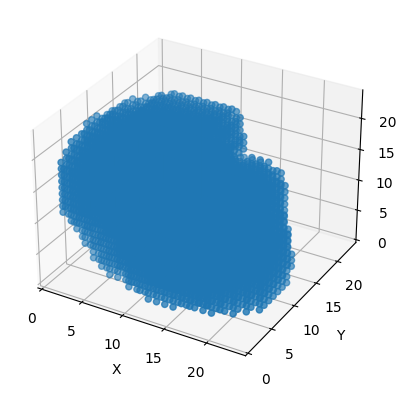

Training Steps Completed: 36
Loss:
0.0360580161


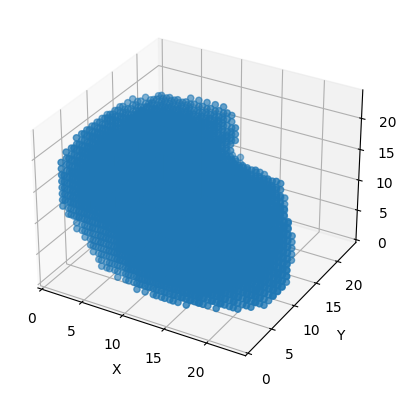

Training Steps Completed: 37
Loss:
0.0335851498


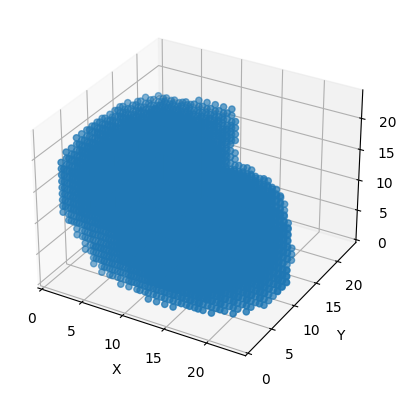

Training Steps Completed: 38
Loss:
0.0366148129


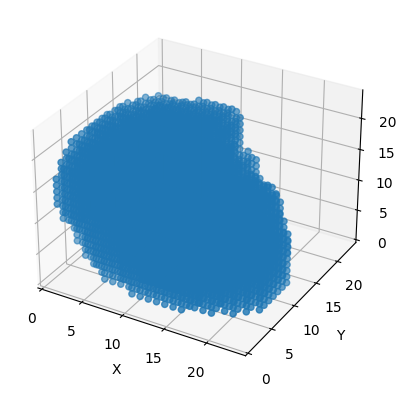

Training Steps Completed: 39
Loss:
0.0346730426


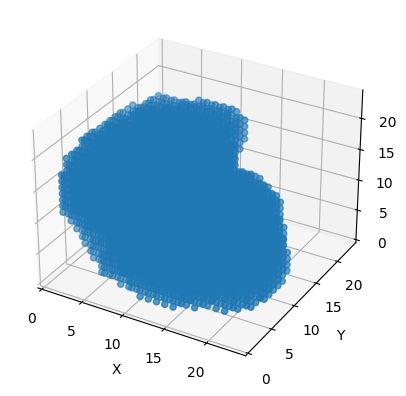

Training Steps Completed: 40
Loss:
0.0310022458


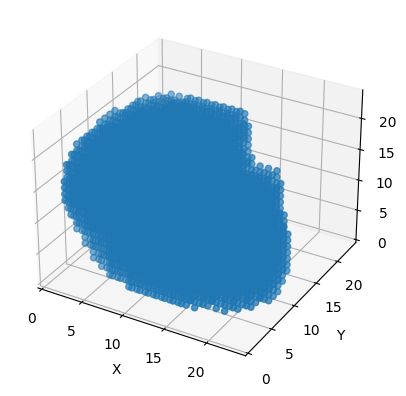

Training Steps Completed: 41
Loss:
0.0362152122


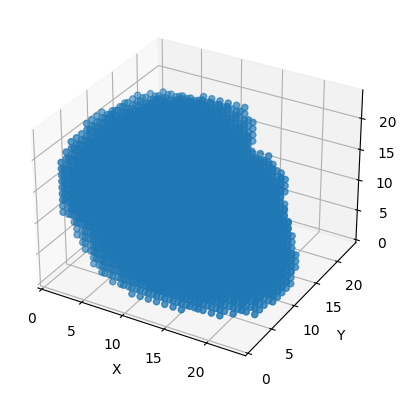

Training Steps Completed: 42
Loss:
0.0315975733


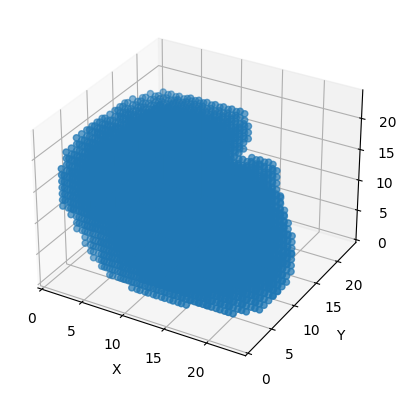

Training Steps Completed: 43
Loss:
0.0483143888


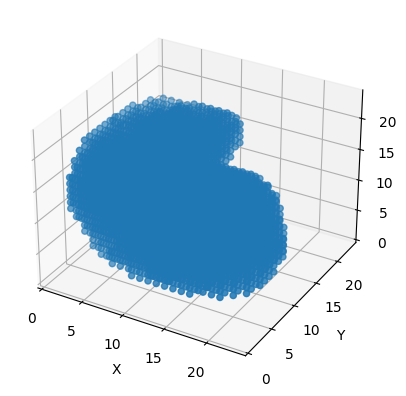

Training Steps Completed: 44
Loss:
0.0489357971


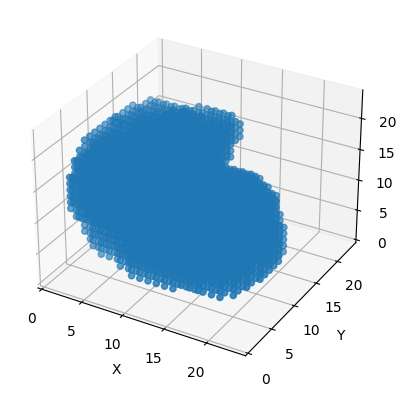

Training Steps Completed: 45
Loss:
0.0409599


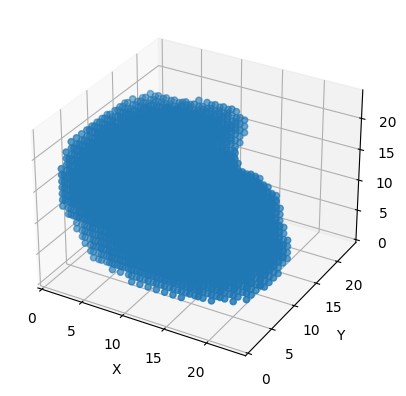

Training Steps Completed: 46
Loss:
0.0362359397


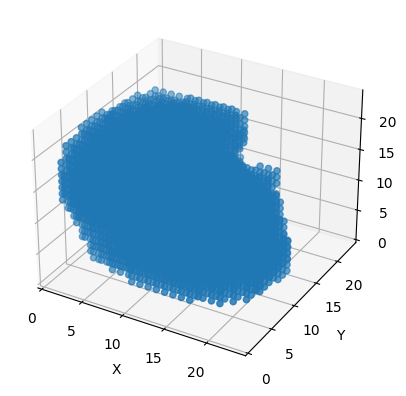

Training Steps Completed: 47
Loss:
0.0394776128


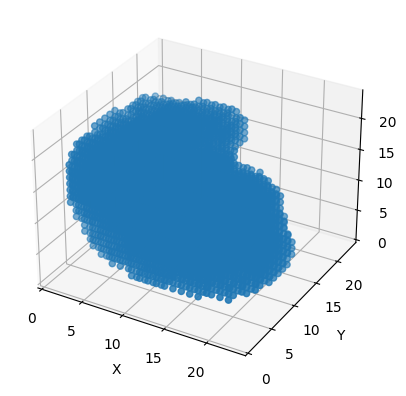

Training Steps Completed: 48
Loss:
0.034915


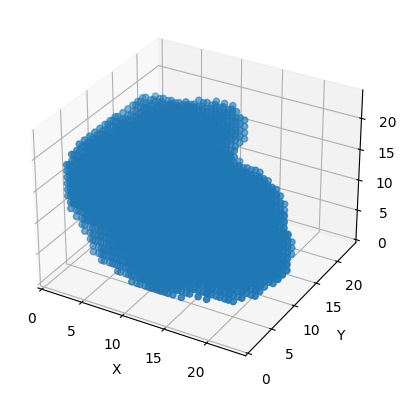

Training Steps Completed: 49
Loss:
0.0341935232


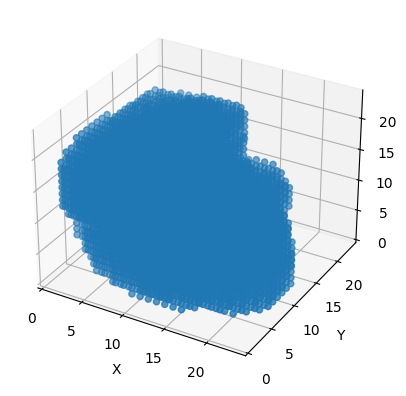

Training Steps Completed: 50
Loss:
0.0338801406


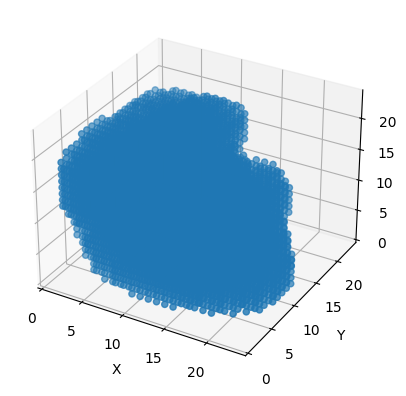

Training Steps Completed: 51
Loss:
0.0291628


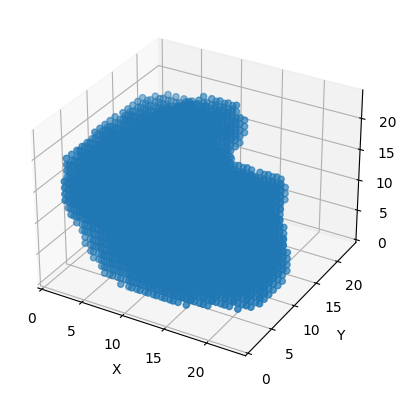

Training Steps Completed: 52
Loss:
0.0260776896


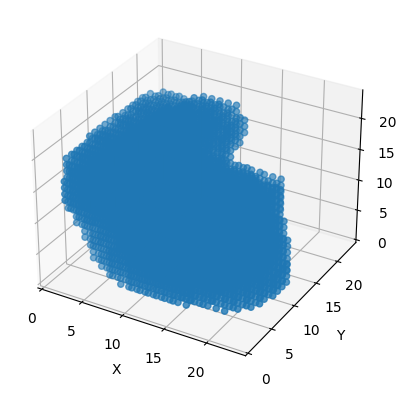

Training Steps Completed: 53
Loss:
0.0297118872


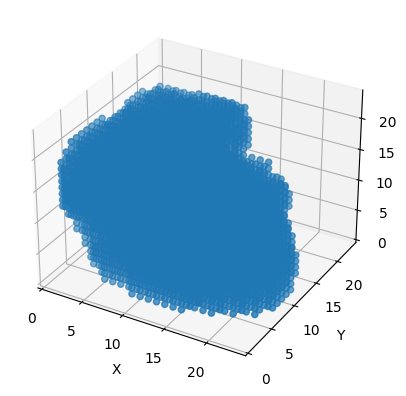

Training Steps Completed: 54
Loss:
0.02919266


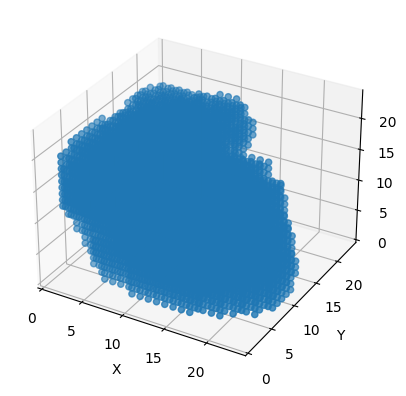

Training Steps Completed: 55
Loss:
0.0264038406


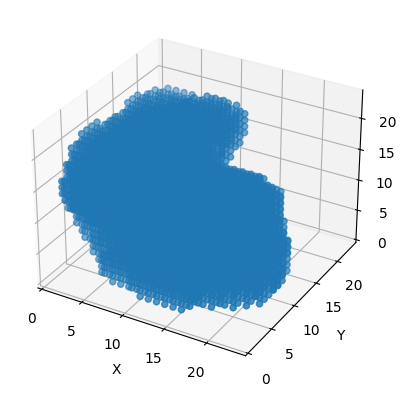

Training Steps Completed: 56
Loss:
0.0248305313


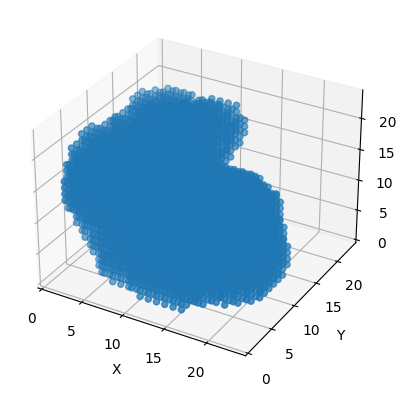

Training Steps Completed: 57
Loss:
0.0245139673


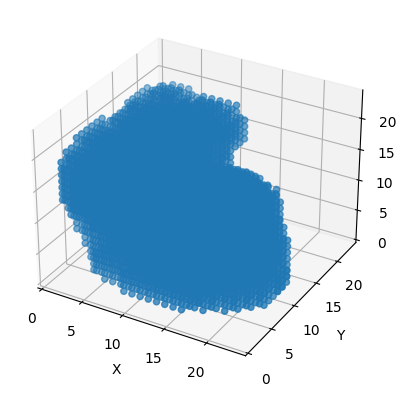

Training Steps Completed: 58
Loss:
0.0224775523


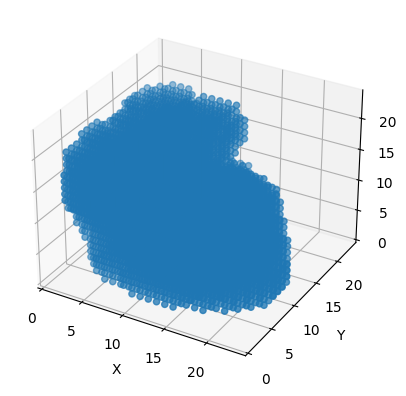

Training Steps Completed: 59
Loss:
0.0254769828


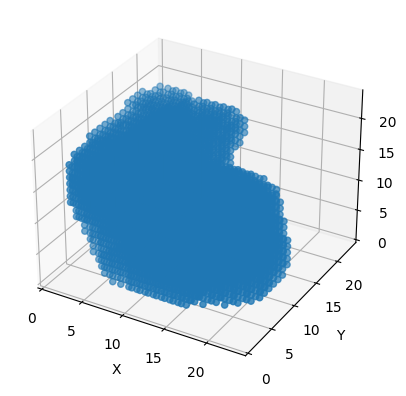

Training Steps Completed: 60
Loss:
0.0233368184


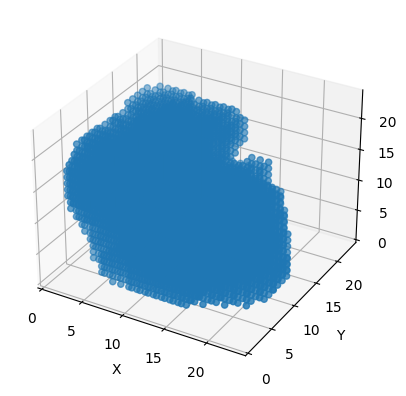

Training Steps Completed: 61
Loss:
0.0235689655


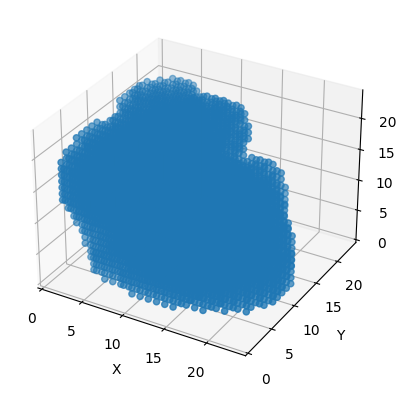

Training Steps Completed: 62
Loss:
0.0211817771


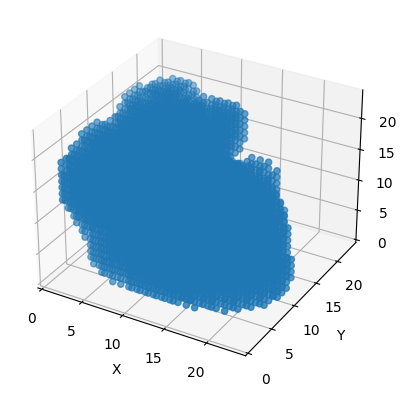

Training Steps Completed: 63
Loss:
0.0236725416


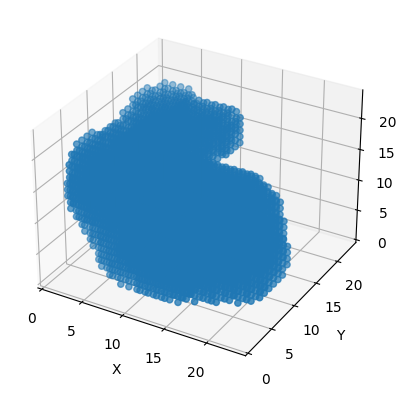

Training Steps Completed: 64
Loss:
0.0228869319


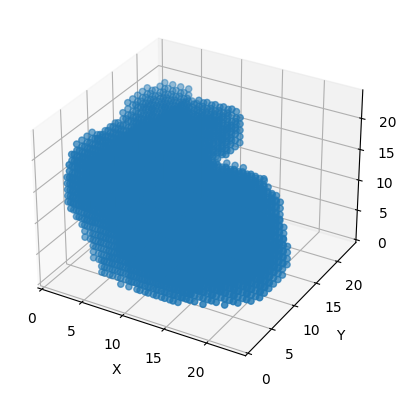

Training Steps Completed: 65
Loss:
0.0196738727


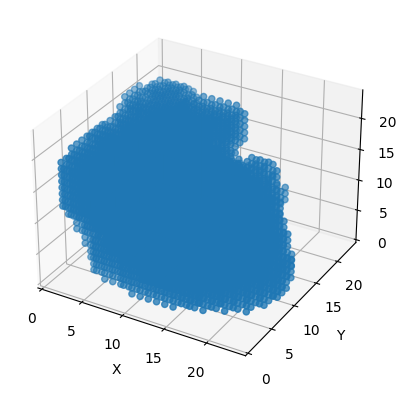

Training Steps Completed: 66
Loss:
0.018078737


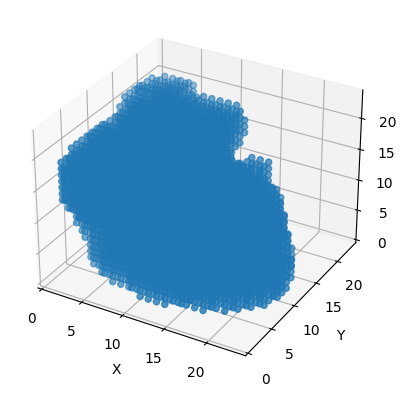

Training Steps Completed: 67
Loss:
0.0213196278


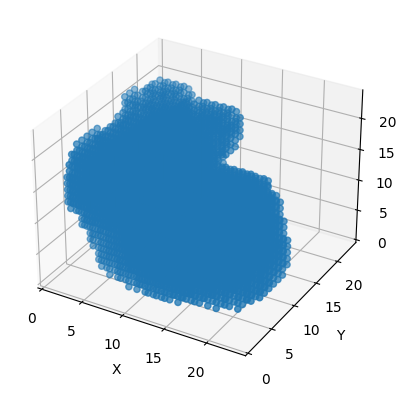

Training Steps Completed: 68
Loss:
0.0208846461


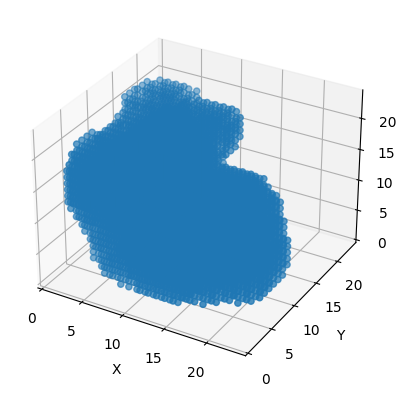

Training Steps Completed: 69
Loss:
0.0184096079


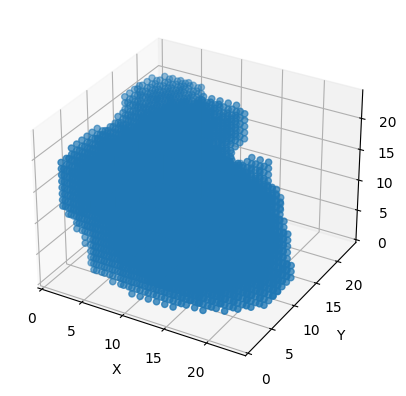

Training Steps Completed: 70
Loss:
0.0173793491


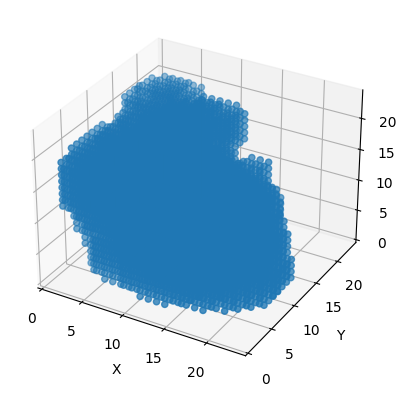

Training Steps Completed: 71
Loss:
0.0183110777


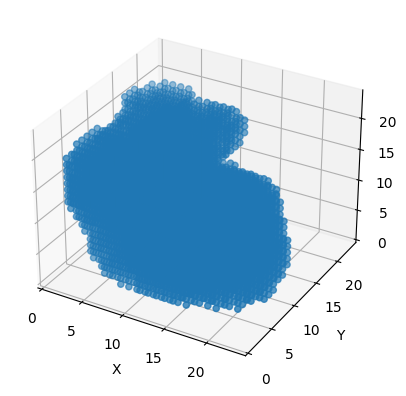

Training Steps Completed: 72
Loss:
0.0178725682


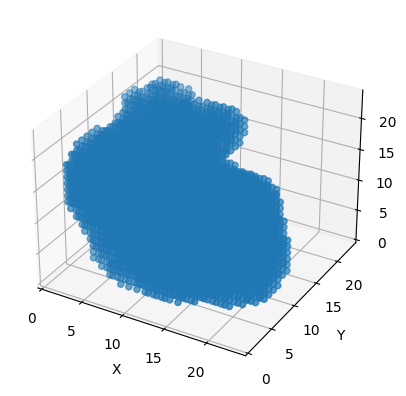

Training Steps Completed: 73
Loss:
0.0163584929


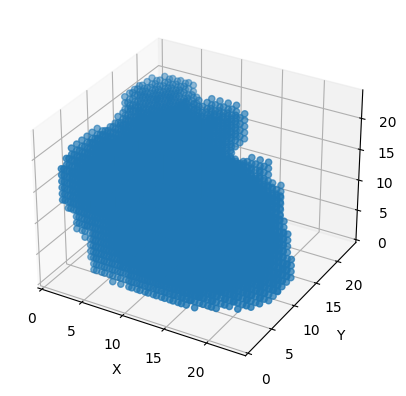

Training Steps Completed: 74
Loss:
0.0164928753


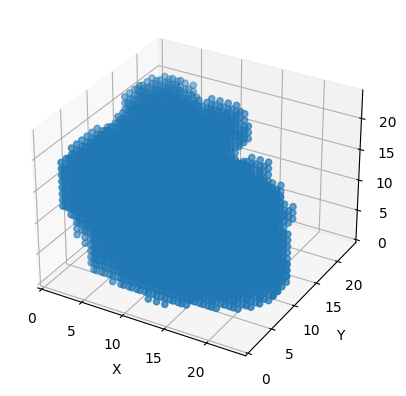

Training Steps Completed: 75
Loss:
0.0186382849


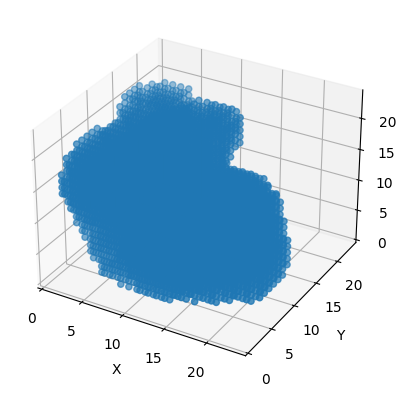

Training Steps Completed: 76
Loss:
0.0160978176


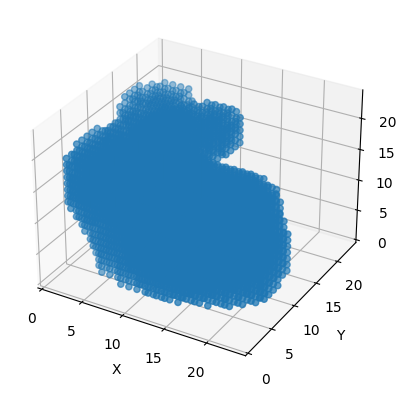

Training Steps Completed: 77
Loss:
0.0150561472


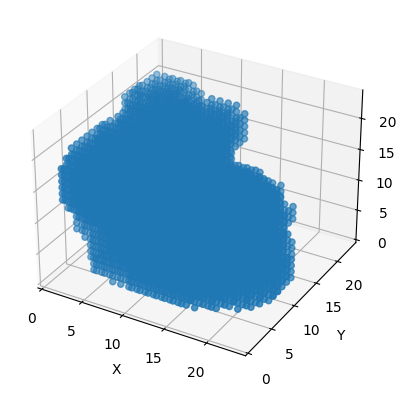

Training Steps Completed: 78
Loss:
0.0175643116


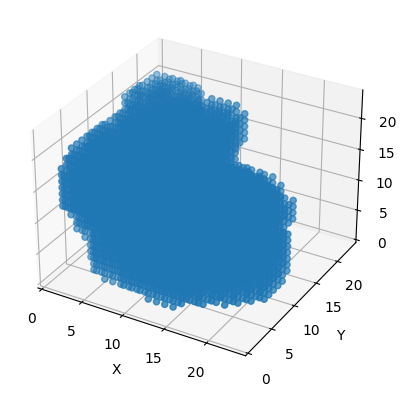

Training Steps Completed: 79
Loss:
0.0137163224


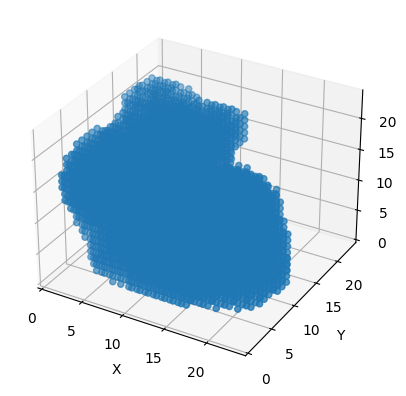

Training Steps Completed: 80
Loss:
0.0144196292


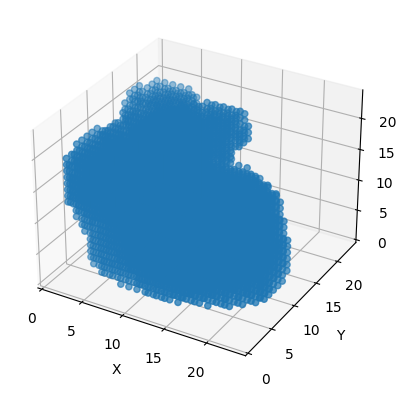

Training Steps Completed: 81
Loss:
0.0126925372


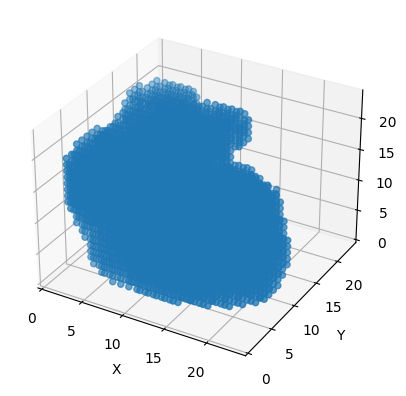

Training Steps Completed: 82
Loss:
0.0156385526


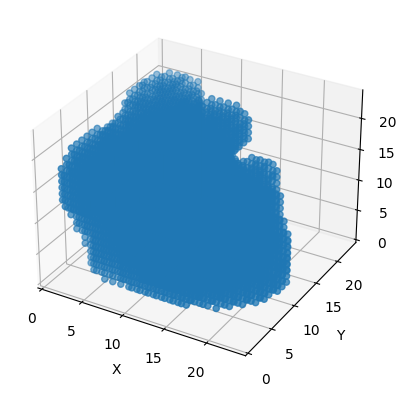

Training Steps Completed: 83
Loss:
0.0156710465


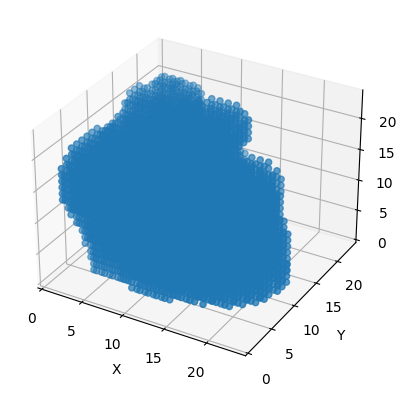

Training Steps Completed: 84
Loss:
0.0141918063


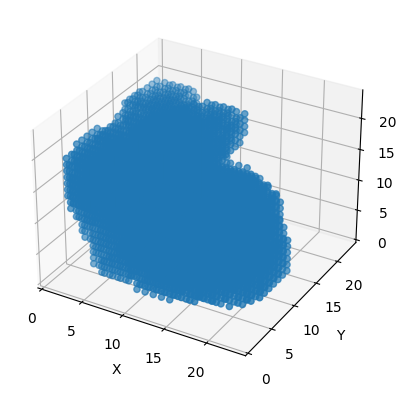

Training Steps Completed: 85
Loss:
0.0141828787


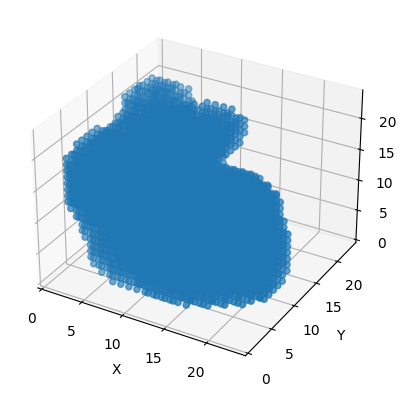

Training Steps Completed: 86
Loss:
0.0155189233


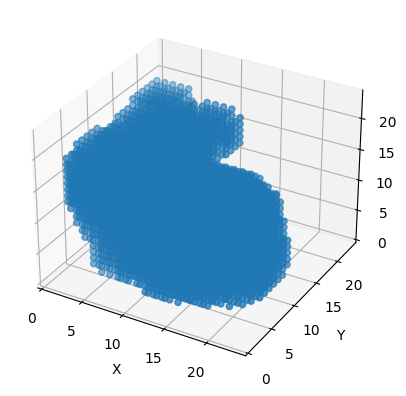

Training Steps Completed: 87
Loss:
0.0124878595


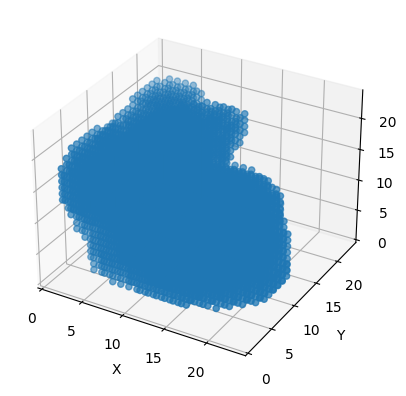

Training Steps Completed: 88
Loss:
0.0166881476


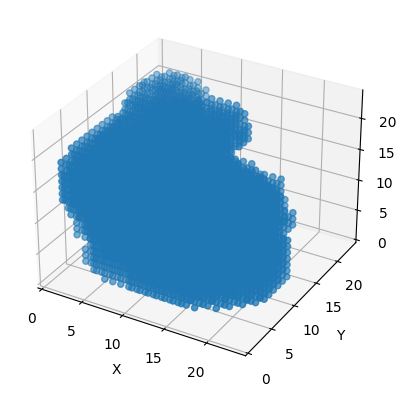

Training Steps Completed: 89
Loss:
0.0154957483


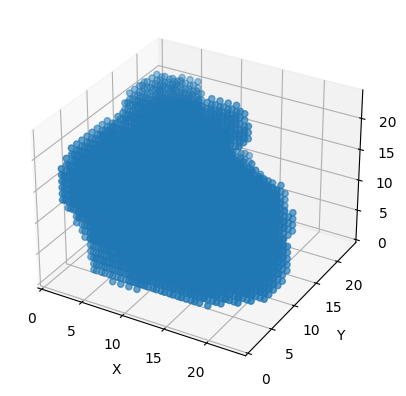

Training Steps Completed: 90
Loss:
0.0189272612


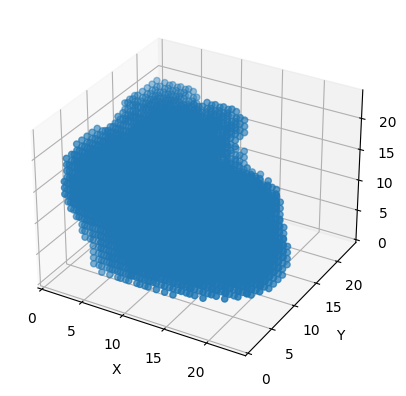

Training Steps Completed: 91
Loss:
0.0156589728


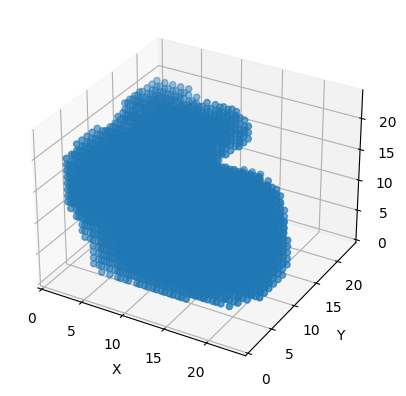

Training Steps Completed: 92
Loss:
0.0149179613


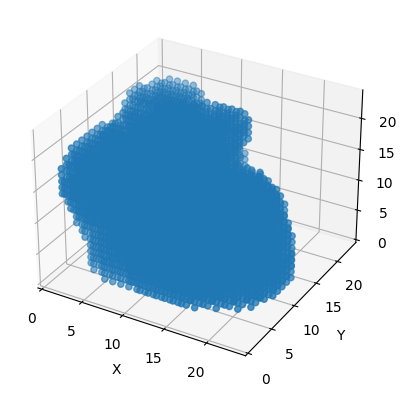

Training Steps Completed: 93
Loss:
0.0140243303


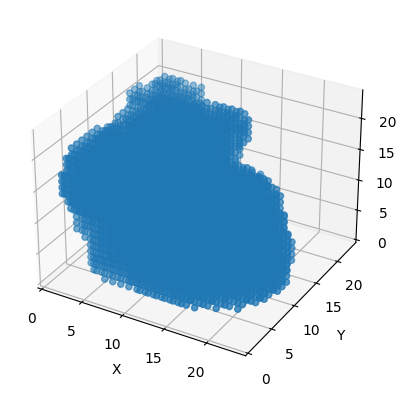

Training Steps Completed: 94
Loss:
0.0127046546


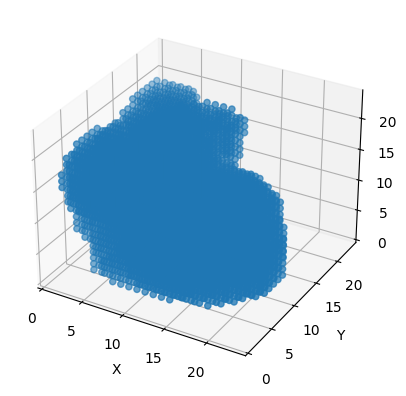

Training Steps Completed: 95
Loss:
0.0119754802


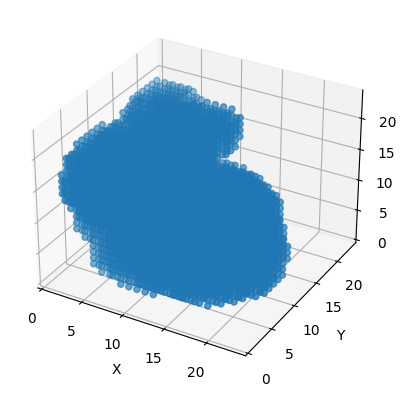

Training Steps Completed: 96
Loss:
0.0111393463


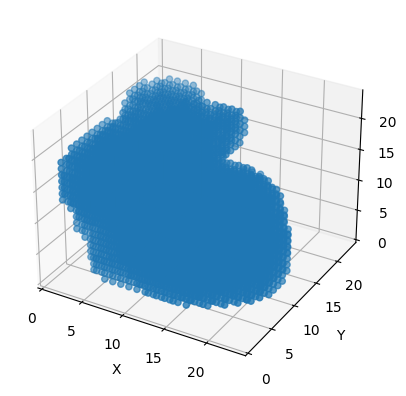

Training Steps Completed: 97
Loss:
0.0105549851


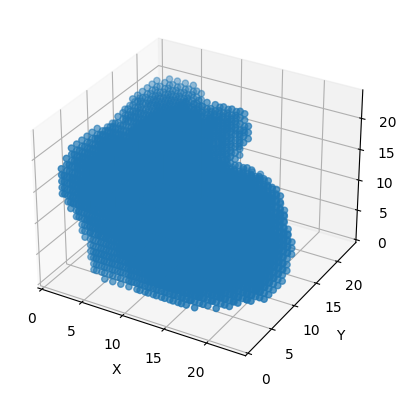

Training Steps Completed: 98
Loss:
0.0115257017


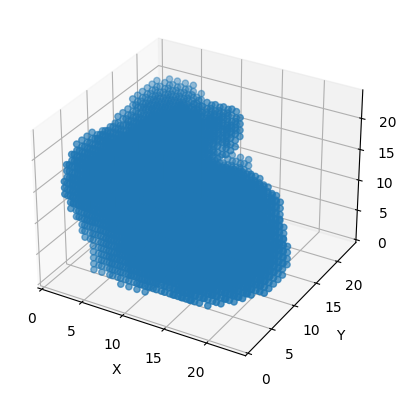

Training Steps Completed: 99
Loss:
0.0111967744


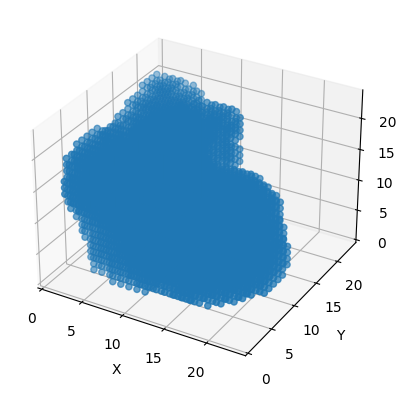

Training Steps Completed: 100
Loss:
0.0120254494


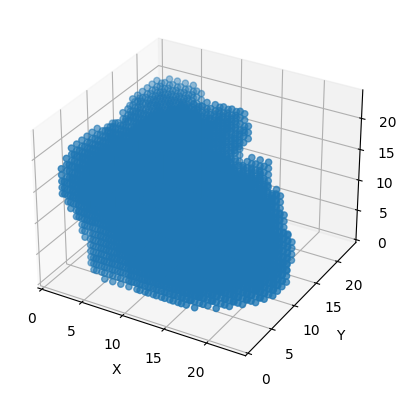

Training Steps Completed: 101
Loss:
0.0118839936


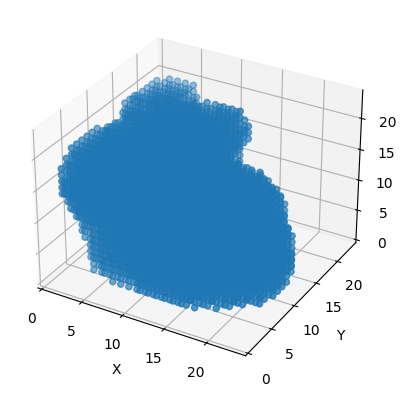

Training Steps Completed: 102
Loss:
0.0131981261


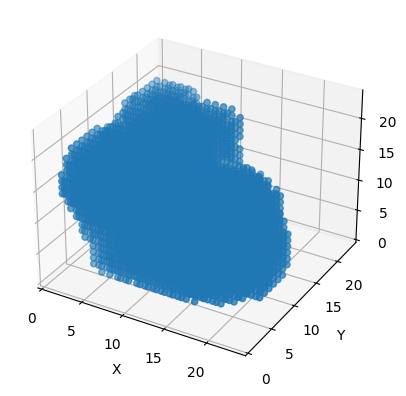

Training Steps Completed: 103
Loss:
0.0106119625


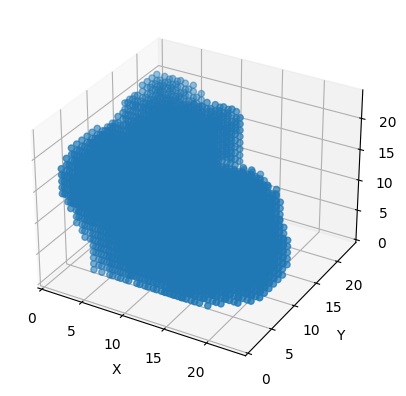

Training Steps Completed: 104
Loss:
0.0132246437


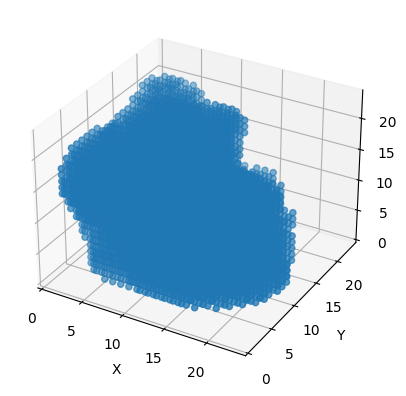

Training Steps Completed: 105
Loss:
0.01158584


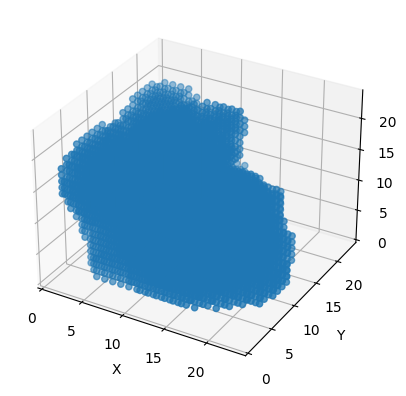

Training Steps Completed: 106
Loss:
0.011493694


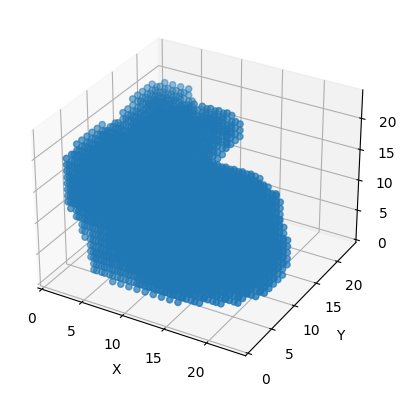

Training Steps Completed: 107
Loss:
0.0119678807


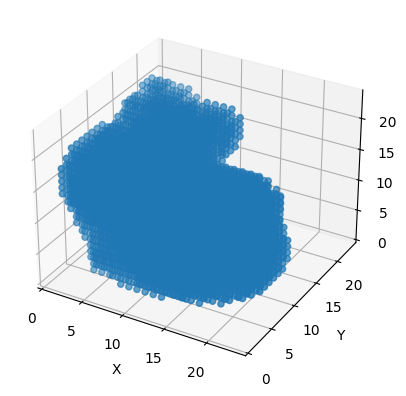

Training Steps Completed: 108
Loss:
0.0109584071


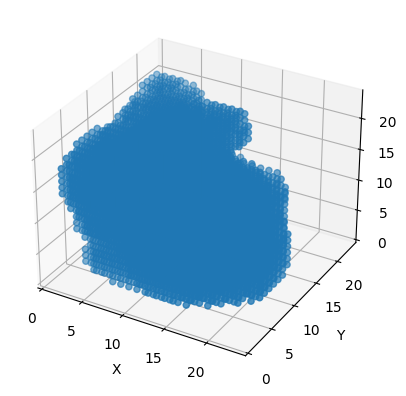

Training Steps Completed: 109
Loss:
0.0102629401


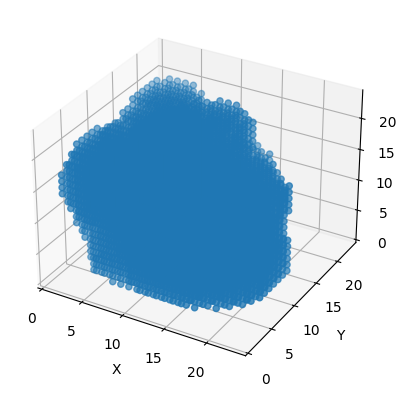

Training Steps Completed: 110
Loss:
0.0119513441


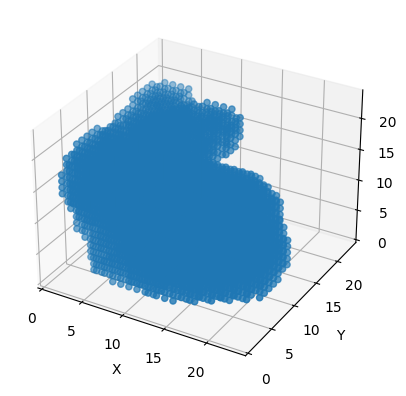

Training Steps Completed: 111
Loss:
0.0123491595


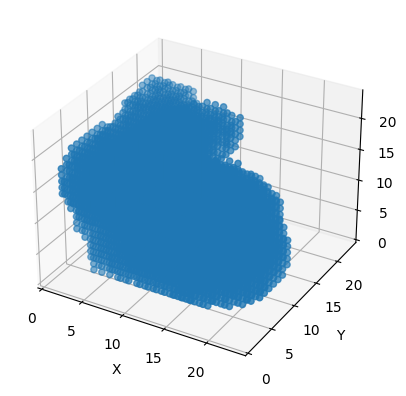

Training Steps Completed: 112
Loss:
0.00982315093


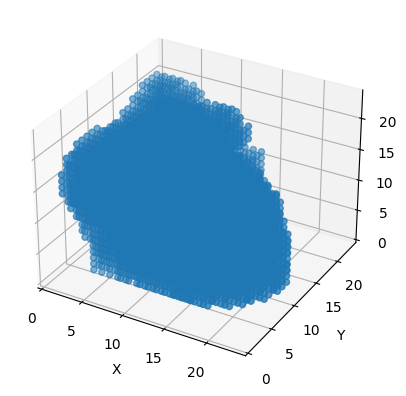

Training Steps Completed: 113
Loss:
0.0115356268


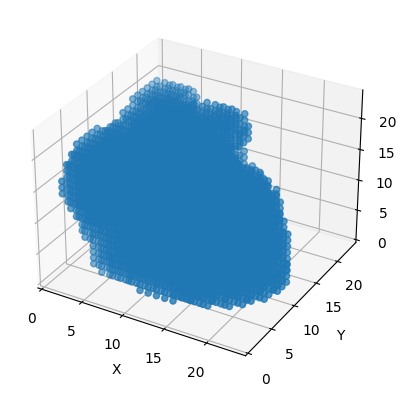

Training Steps Completed: 114
Loss:
0.0119637176


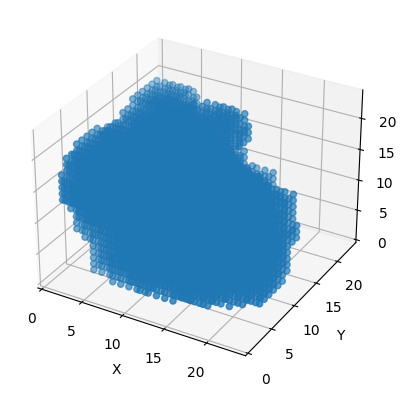

Training Steps Completed: 115
Loss:
0.0130749587


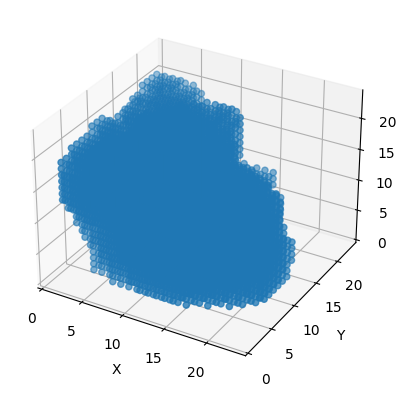

Training Steps Completed: 116
Loss:
0.0121817812


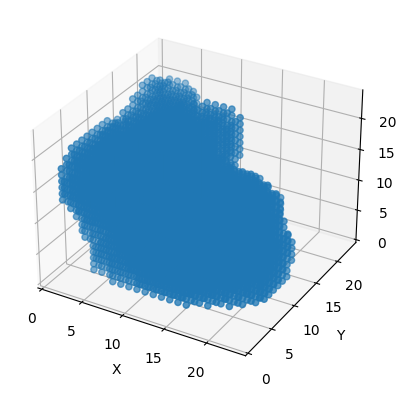

Training Steps Completed: 117
Loss:
0.0128427967


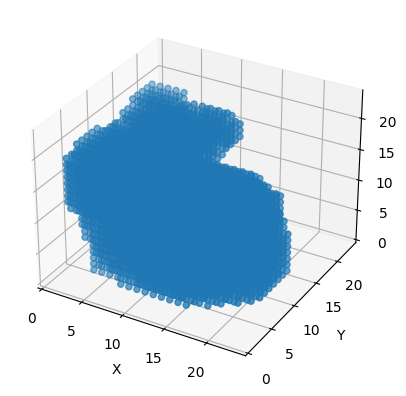

Training Steps Completed: 118
Loss:
0.0139876092


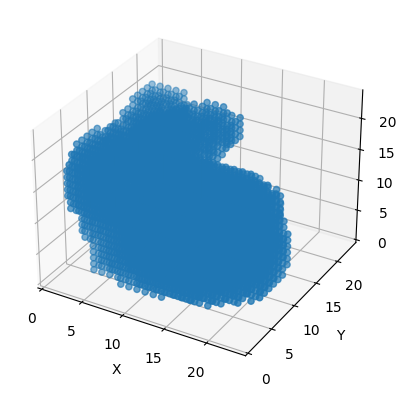

Training Steps Completed: 119
Loss:
0.011438014


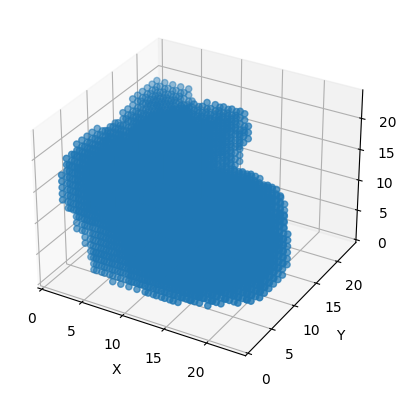

Training Steps Completed: 120
Loss:
0.0123683941


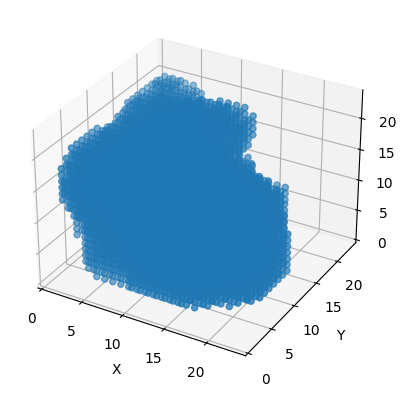

Training Steps Completed: 121
Loss:
0.0111130401


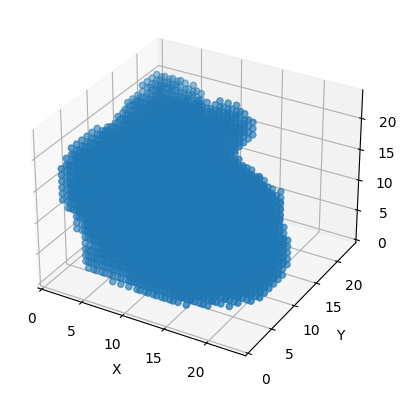

Training Steps Completed: 122
Loss:
0.0117785735


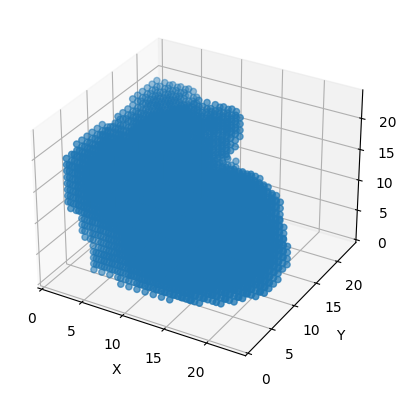

Training Steps Completed: 123
Loss:
0.0113469698


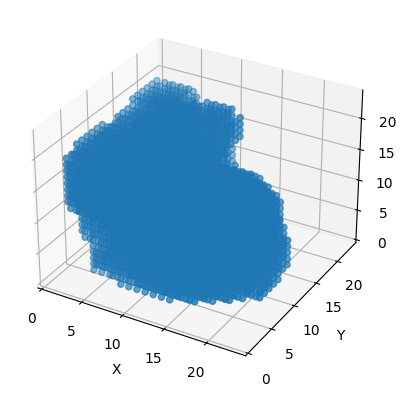

Training Steps Completed: 124
Loss:
0.00977560226


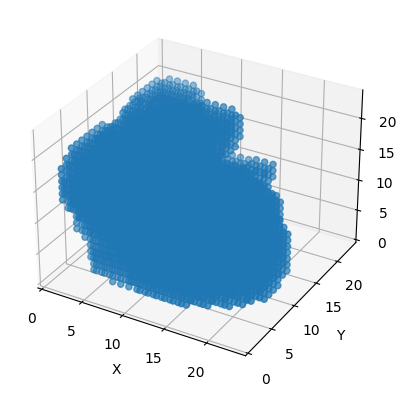

Training Steps Completed: 125
Loss:
0.00980600249


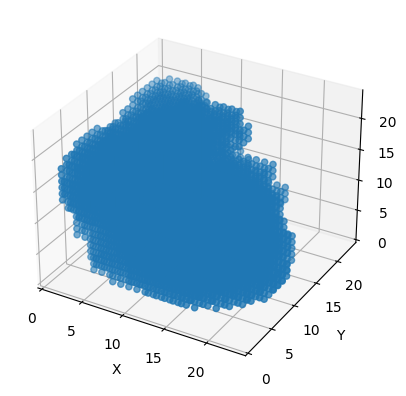

Training Steps Completed: 126
Loss:
0.0103746


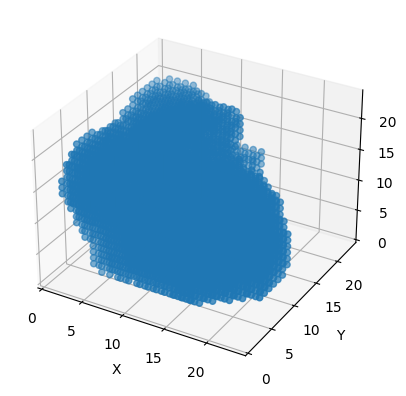

Training Steps Completed: 127
Loss:
0.00944147911


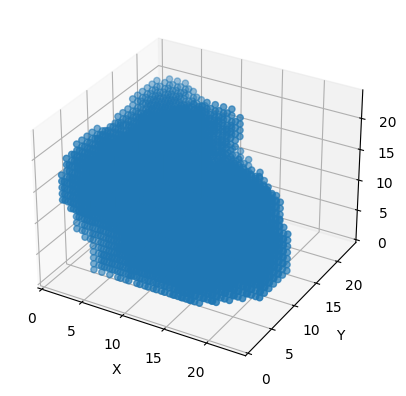

Training Steps Completed: 128
Loss:
0.0111215692


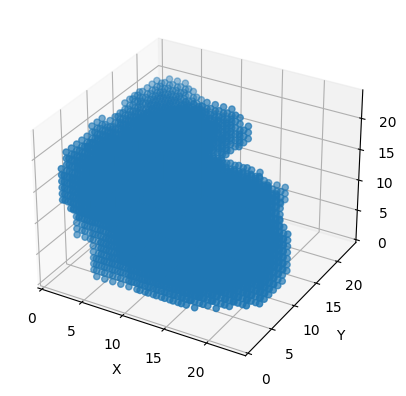

Training Steps Completed: 129
Loss:
0.0102149826


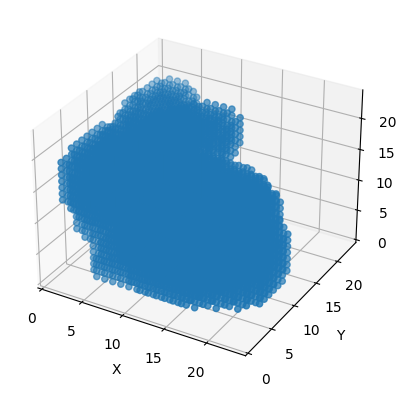

Training Steps Completed: 130
Loss:
0.0102297906


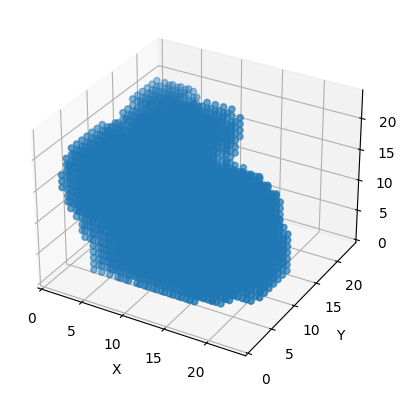

Training Steps Completed: 131
Loss:
0.00963420048


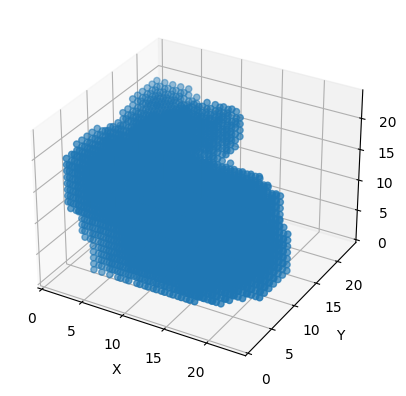

Training Steps Completed: 132
Loss:
0.00957125798


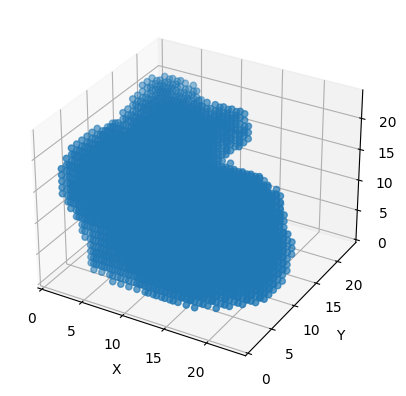

Training Steps Completed: 133
Loss:
0.00928240921


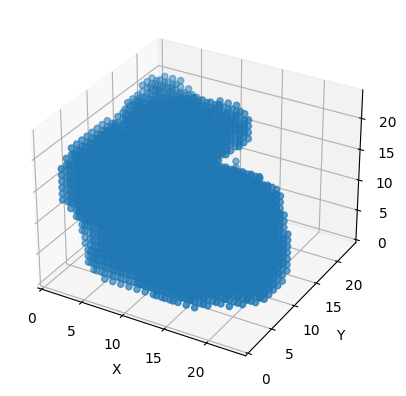

Training Steps Completed: 134
Loss:
0.00839159


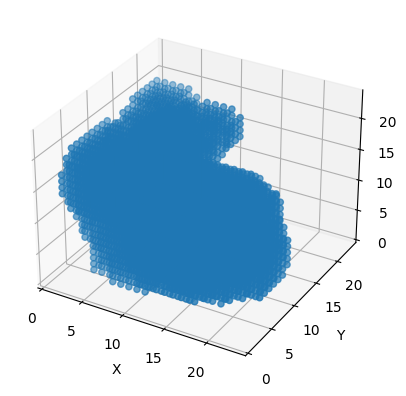

Training Steps Completed: 135
Loss:
0.00822531153


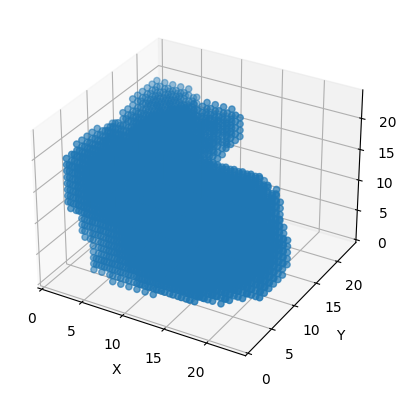

Training Steps Completed: 136
Loss:
0.00795939192


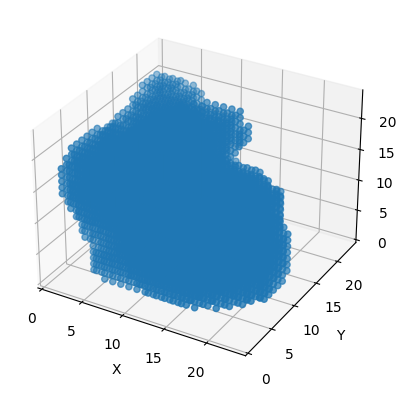

Training Steps Completed: 137
Loss:
0.00731958169


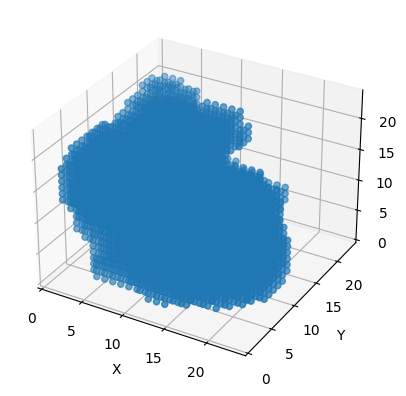

Training Steps Completed: 138
Loss:
0.00913605746


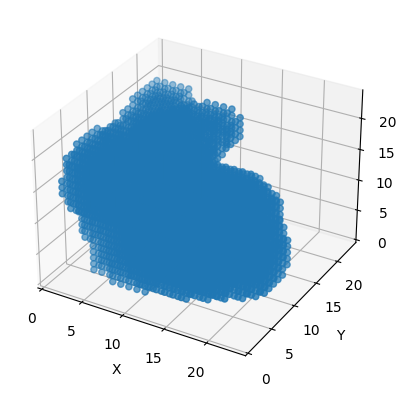

Training Steps Completed: 139
Loss:
0.00899189245


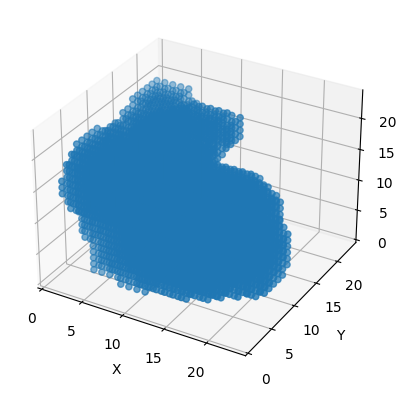

Training Steps Completed: 140
Loss:
0.00768893305


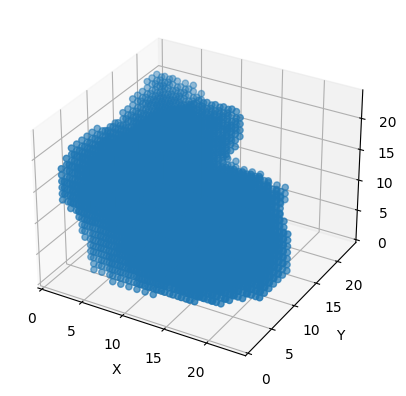

Training Steps Completed: 141
Loss:
0.0075919684


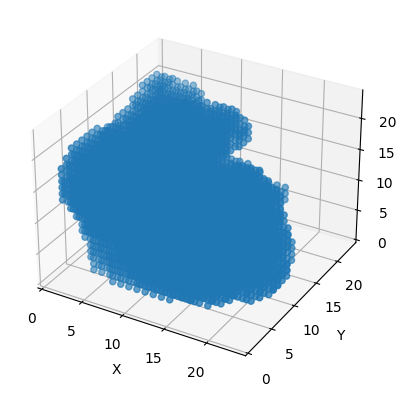

Training Steps Completed: 142
Loss:
0.0101552587


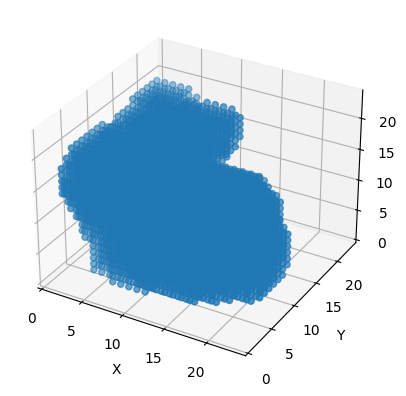

Training Steps Completed: 143
Loss:
0.0079784384


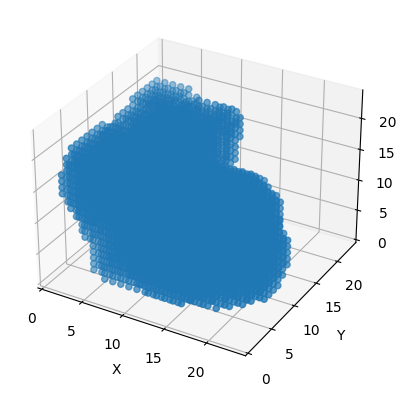

Training Steps Completed: 144
Loss:
0.00942592137


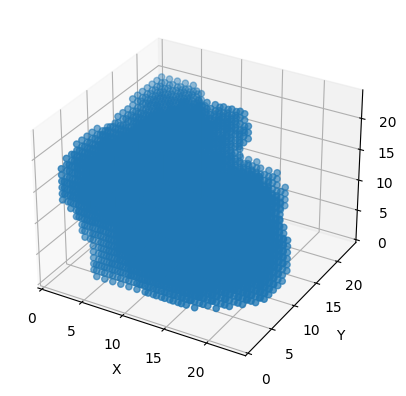

Training Steps Completed: 145
Loss:
0.00869291555


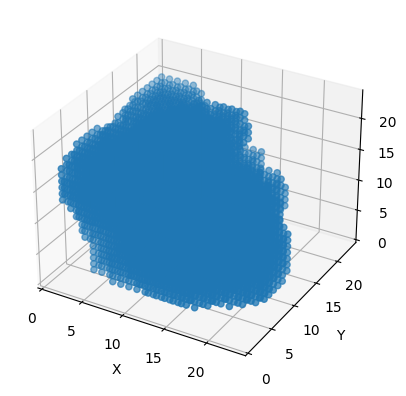

Training Steps Completed: 146
Loss:
0.00695012463


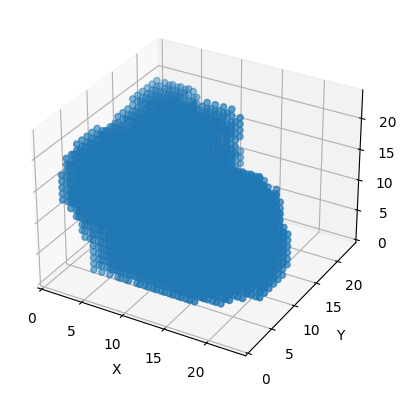

Training Steps Completed: 147
Loss:
0.00710461428


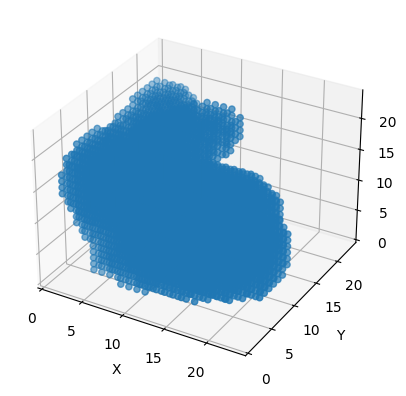

Training Steps Completed: 148
Loss:
0.00711189723


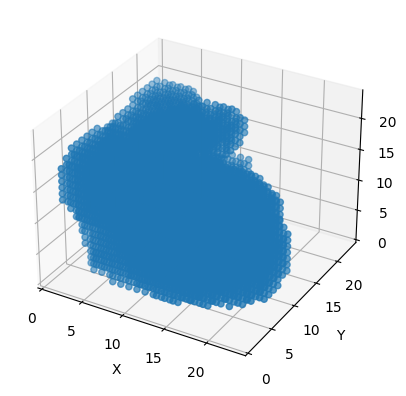

Training Steps Completed: 149
Loss:
0.00661112415


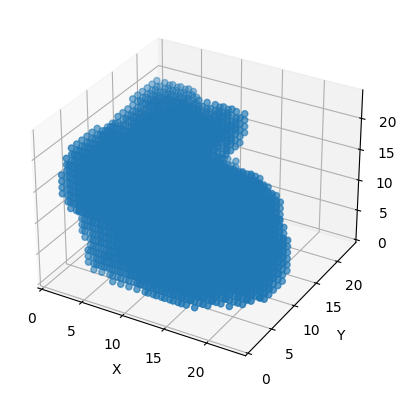

Training Steps Completed: 150
Loss:
0.00787550863


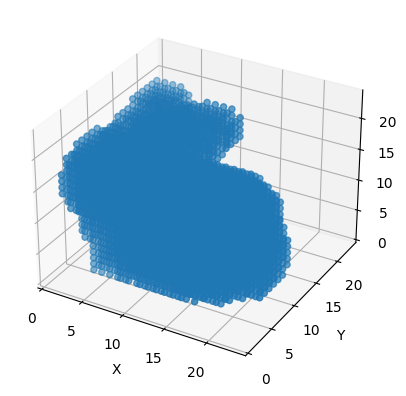

Training Steps Completed: 151
Loss:
0.0078000105


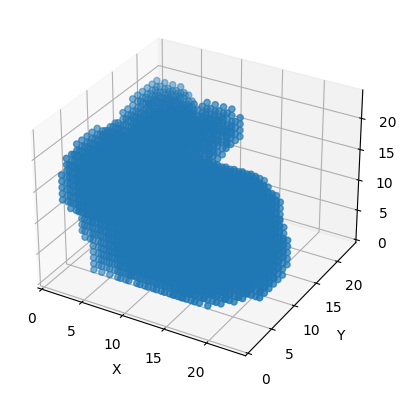

Training Steps Completed: 152
Loss:
0.00742125511


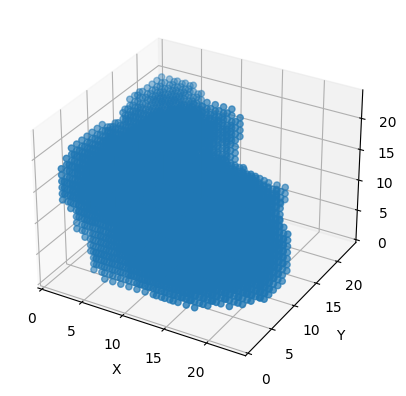

Training Steps Completed: 153
Loss:
0.00701724365


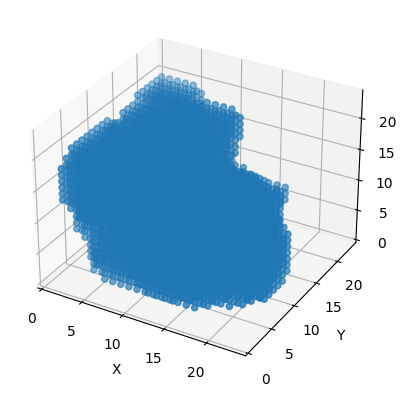

Training Steps Completed: 154
Loss:
0.00736597087


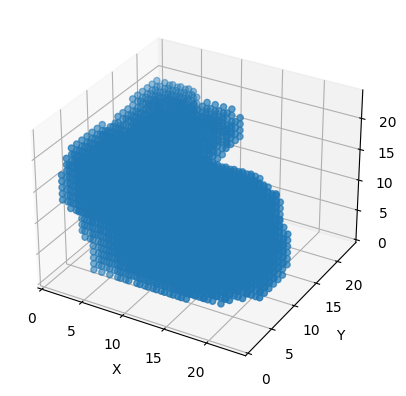

Training Steps Completed: 155
Loss:
0.00616729492


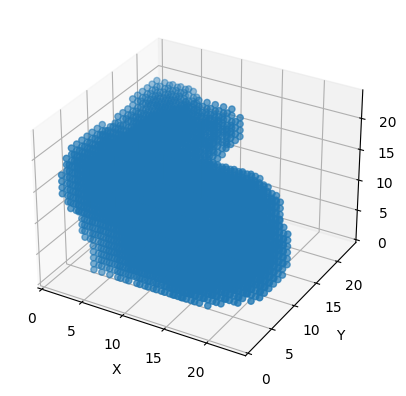

Training Steps Completed: 156
Loss:
0.00666508777


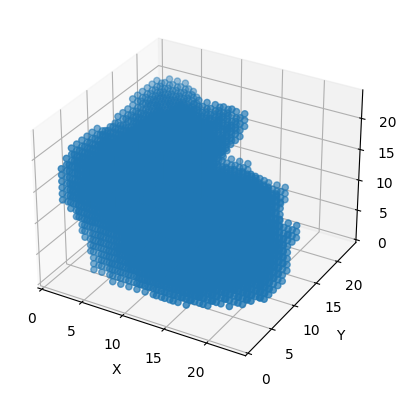

Training Steps Completed: 157
Loss:
0.00619438943


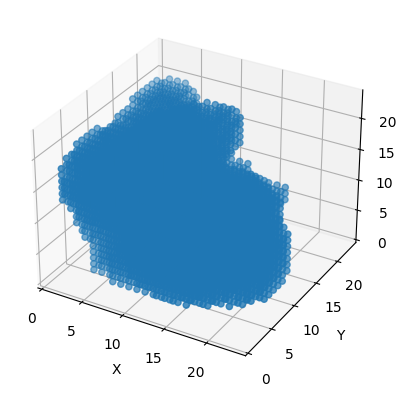

Training Steps Completed: 158
Loss:
0.00851855893


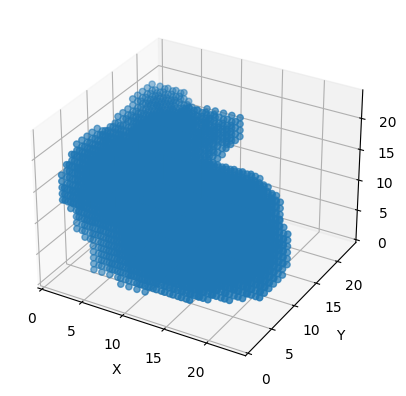

Training Steps Completed: 159
Loss:
0.00774464663


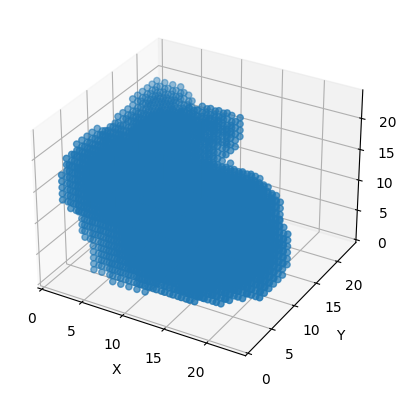

Training Steps Completed: 160
Loss:
0.00601566723


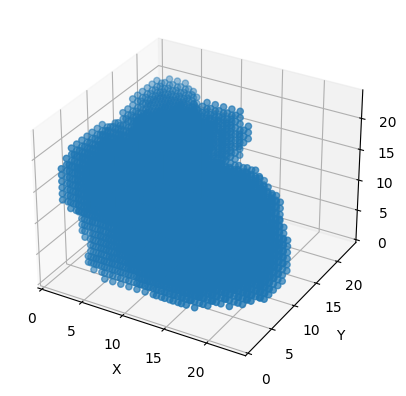

Training Steps Completed: 161
Loss:
0.00661506969


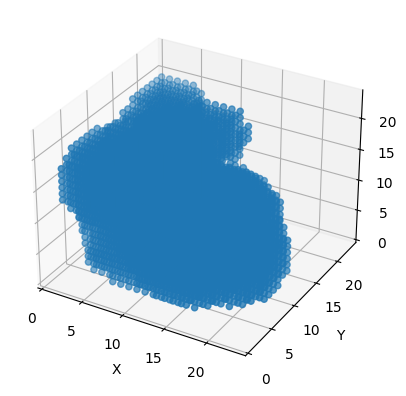

Training Steps Completed: 162
Loss:
0.00590404961


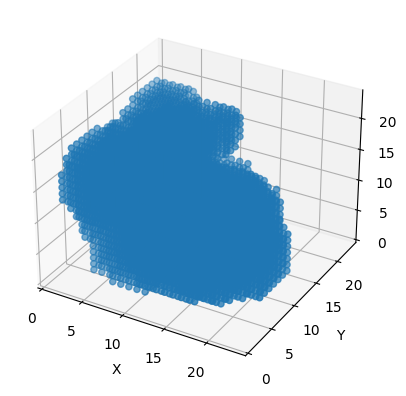

Training Steps Completed: 163
Loss:
0.00797654502


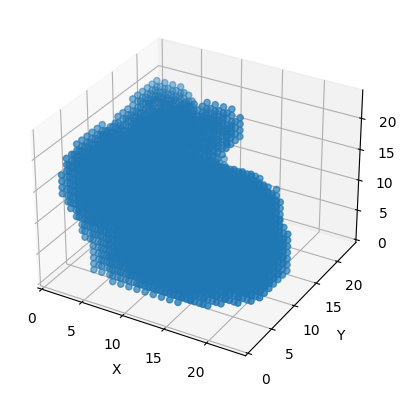

Training Steps Completed: 164
Loss:
0.00894846581


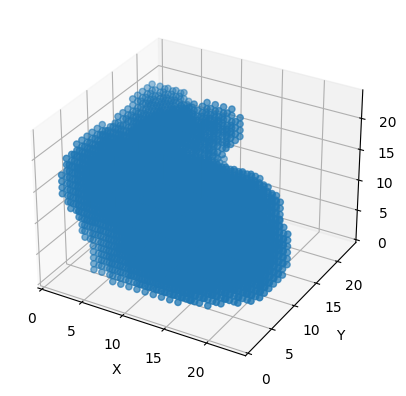

Training Steps Completed: 165
Loss:
0.00737916538


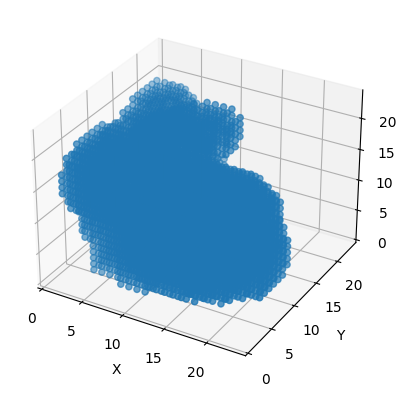

Training Steps Completed: 166
Loss:
0.00707813166


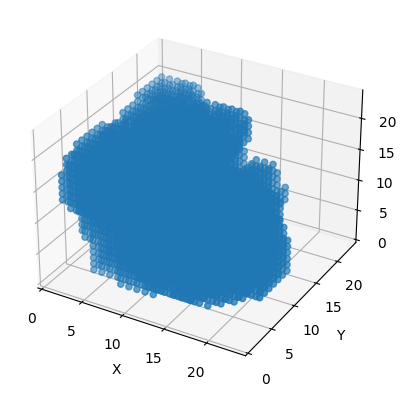

Training Steps Completed: 167
Loss:
0.00902610924


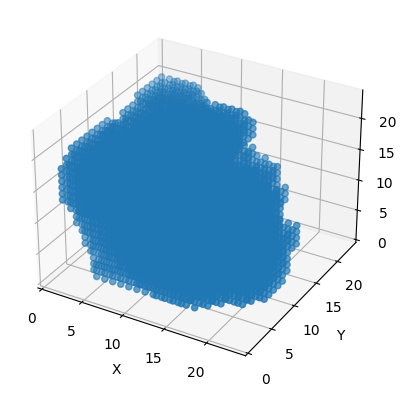

Training Steps Completed: 168
Loss:
0.00790898781


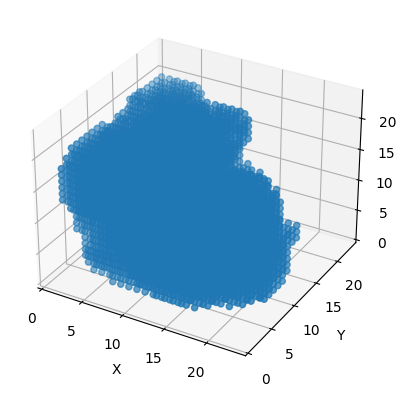

Training Steps Completed: 169
Loss:
0.00637100125


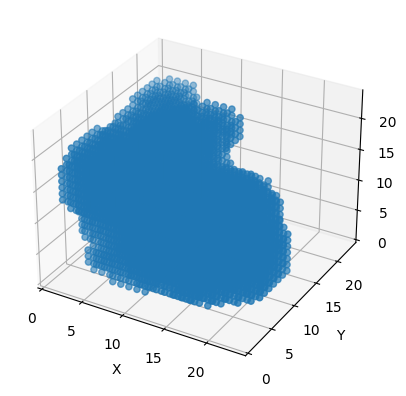

Training Steps Completed: 170
Loss:
0.00770167587


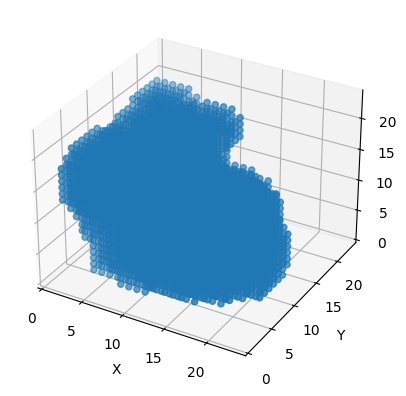

Training Steps Completed: 171
Loss:
0.00597545551


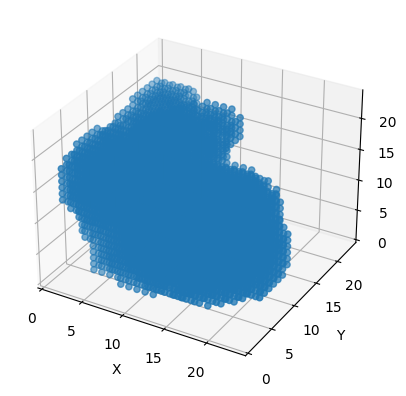

Training Steps Completed: 172
Loss:
0.00765476516


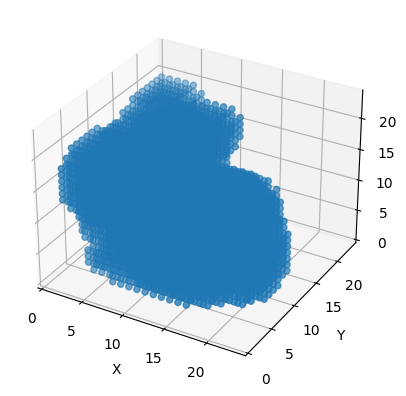

Training Steps Completed: 173
Loss:
0.00765451463


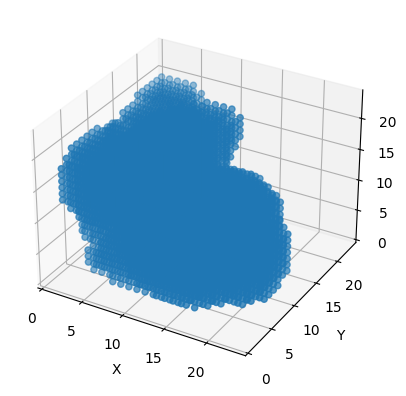

Training Steps Completed: 174
Loss:
0.00506690936


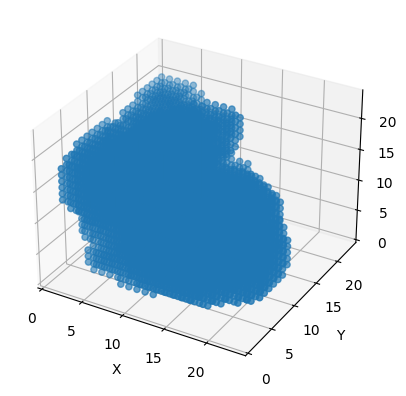

Training Steps Completed: 175
Loss:
0.00554546481


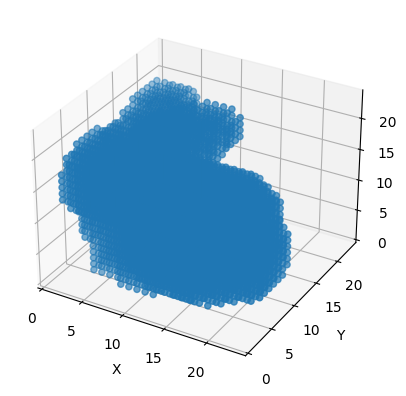

Training Steps Completed: 176
Loss:
0.00520509202


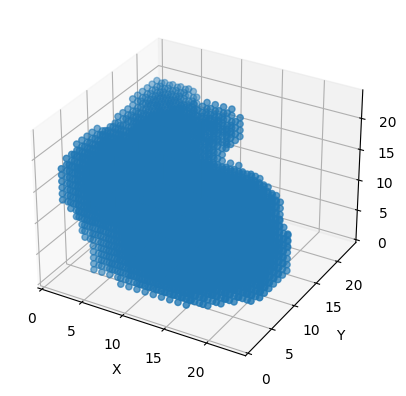

Training Steps Completed: 177
Loss:
0.00480948109


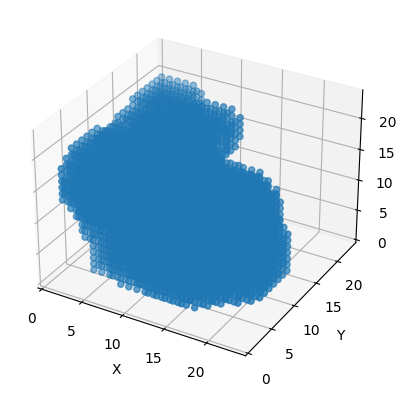

Training Steps Completed: 178
Loss:
0.00473342789


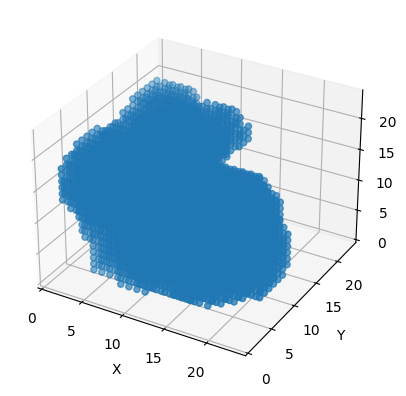

Training Steps Completed: 179
Loss:
0.00586416246


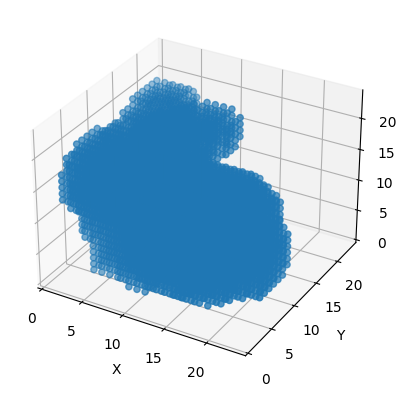

Training Steps Completed: 180
Loss:
0.00553312851


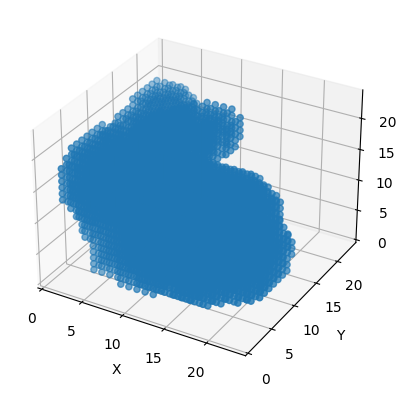

Training Steps Completed: 181
Loss:
0.00524105411


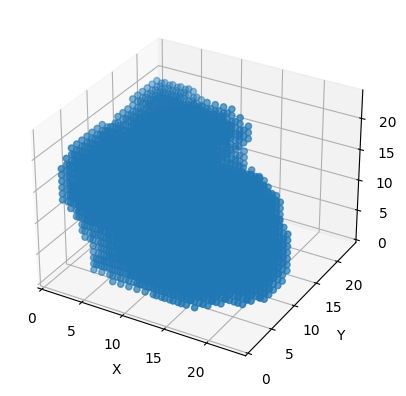

Training Steps Completed: 182
Loss:
0.00559641467


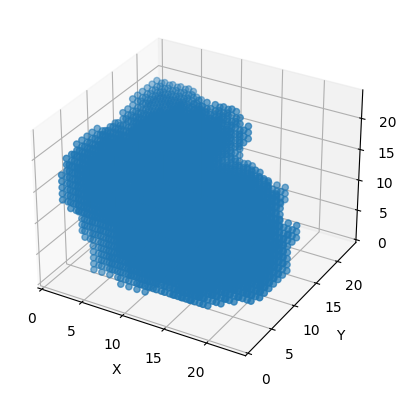

Training Steps Completed: 183
Loss:
0.00658837752


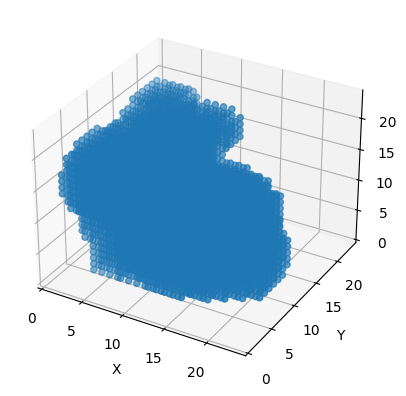

Training Steps Completed: 184
Loss:
0.00664605899


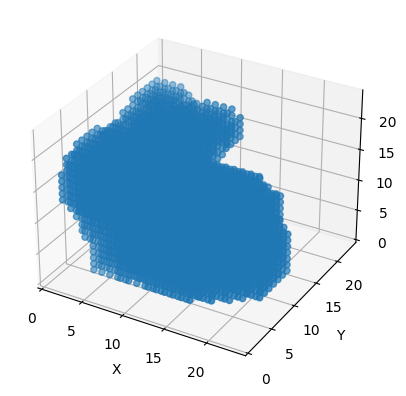

Training Steps Completed: 185
Loss:
0.00653923629


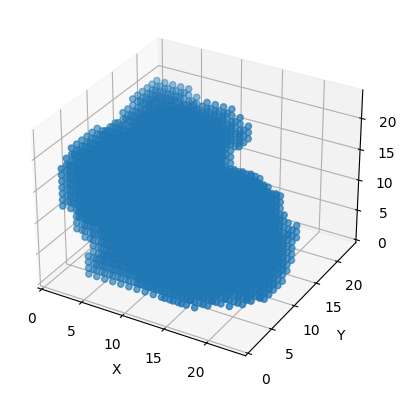

Training Steps Completed: 186
Loss:
0.00554555748


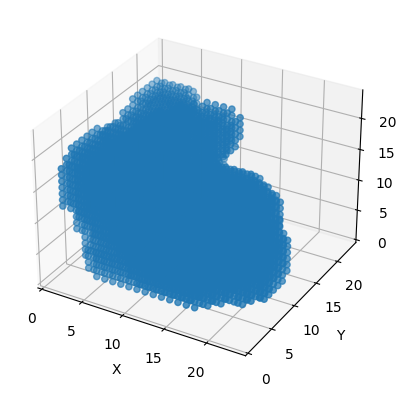

Training Steps Completed: 187
Loss:
0.00595278619


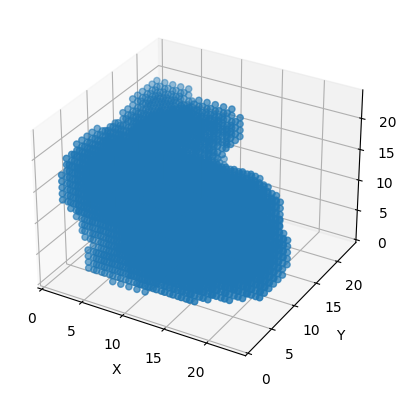

Training Steps Completed: 188
Loss:
0.0054985988


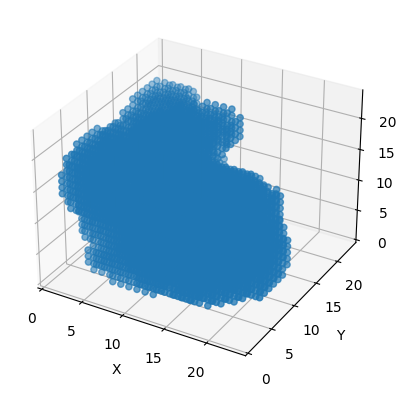

Training Steps Completed: 189
Loss:
0.0055035376


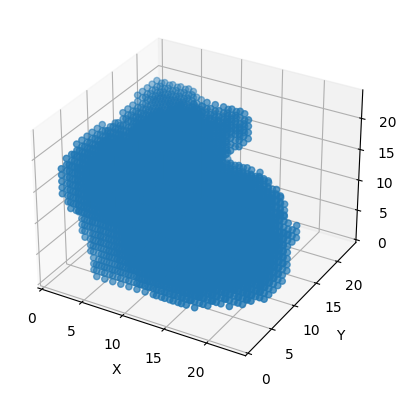

Training Steps Completed: 190
Loss:
0.0048332205


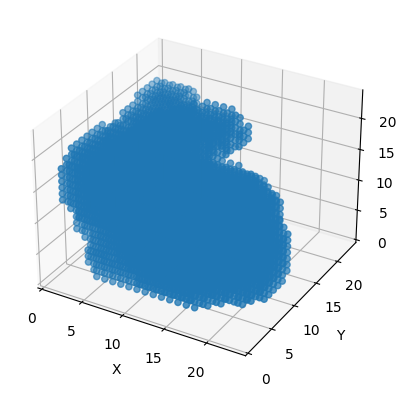

Training Steps Completed: 191
Loss:
0.0052707009


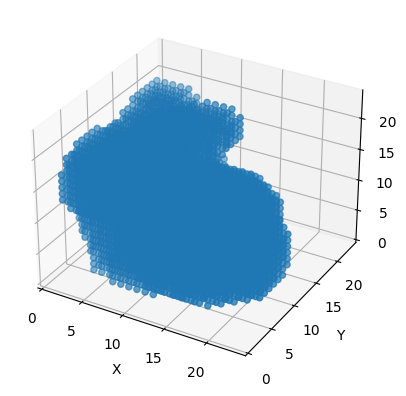

Training Steps Completed: 192
Loss:
0.00475107413


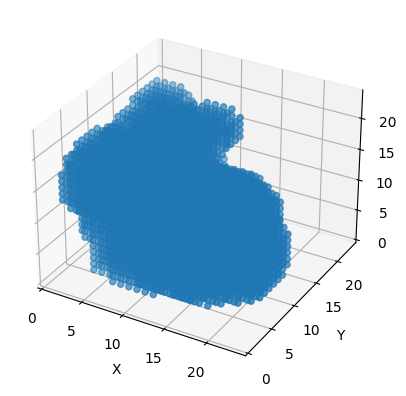

Training Steps Completed: 193
Loss:
0.00512712961


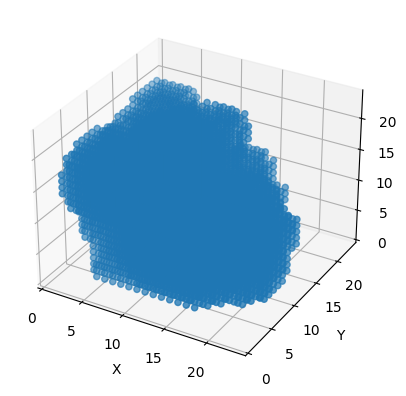

Training Steps Completed: 194
Loss:
0.00419273041


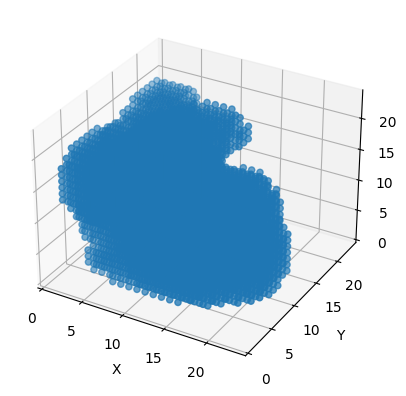

Training Steps Completed: 195
Loss:
0.00662722066


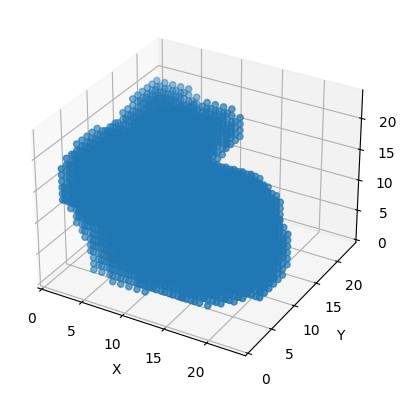

Training Steps Completed: 196
Loss:
0.00463769352


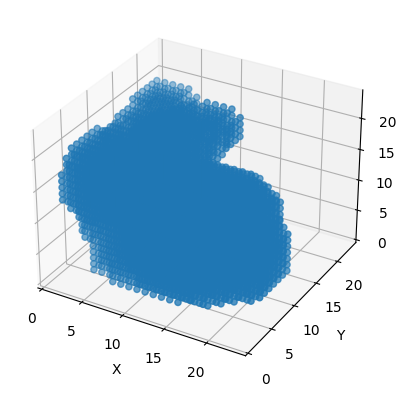

Training Steps Completed: 197
Loss:
0.00493036257


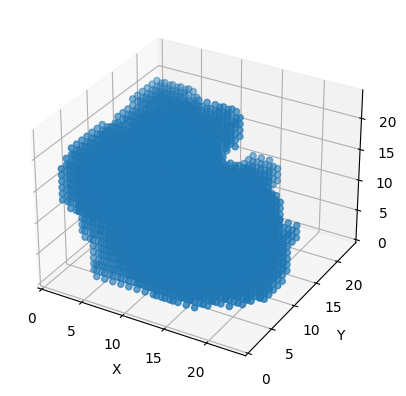

Training Steps Completed: 198
Loss:
0.00464251637


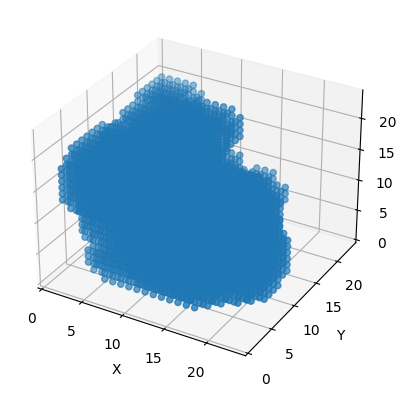

Training Steps Completed: 199
Loss:
0.00538075762


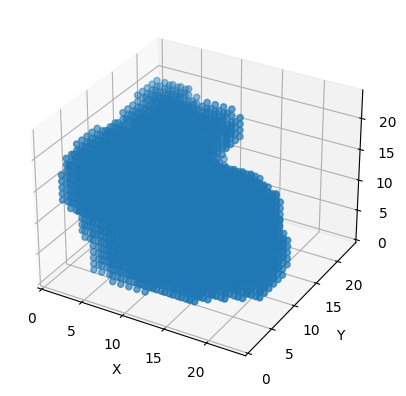

Training Steps Completed: 200
Loss:
0.00497058081


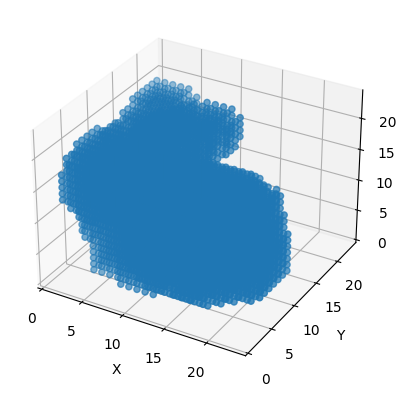

In [ ]:
grid.train(200)

In [ ]:
visualize_3d_grid(grid.state_grid)

In [ ]:
#grid = CA(target_object)

Seed Shape =  (1, 24, 24, 24, 16)
Target Shape =  (1, 24, 24, 24, 2)
Seed and target initialized


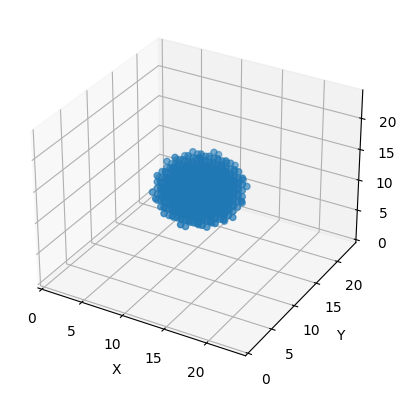

Time step  1


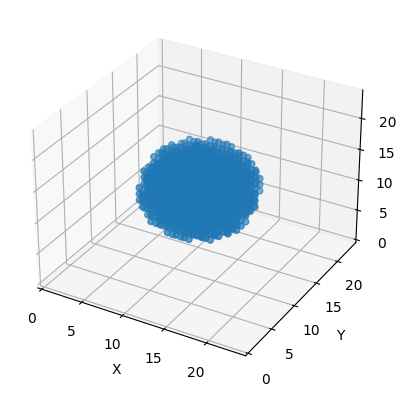

Time step  2


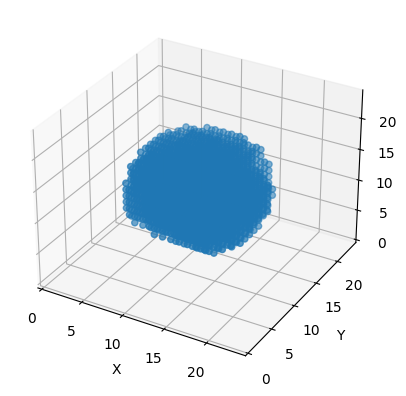

Time step  3


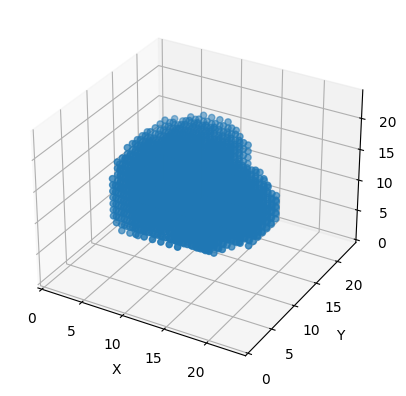

Time step  4


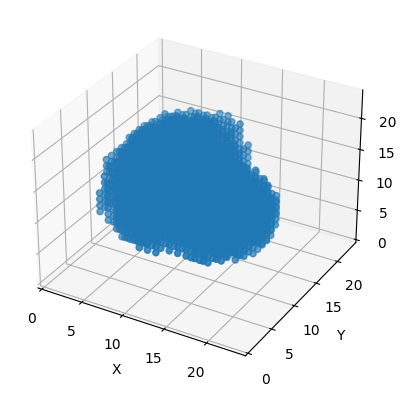

Time step  5


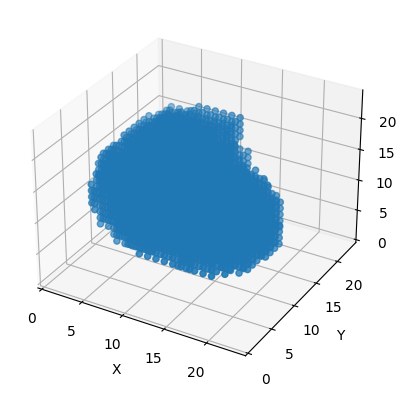

Time step  6


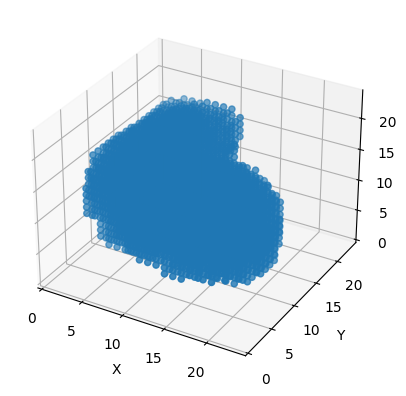

Time step  7


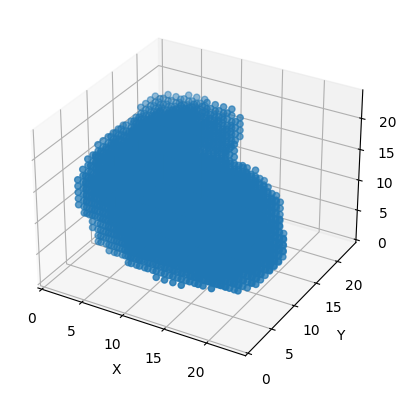

Time step  8


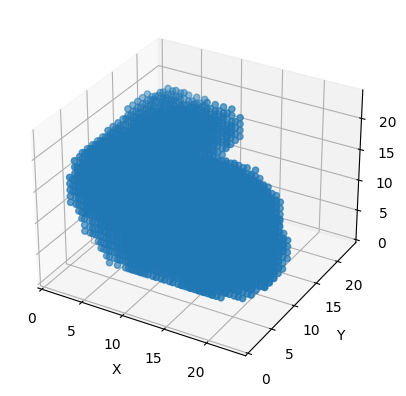

Time step  9


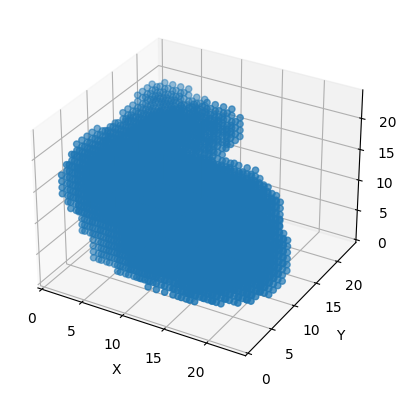

Time step  10


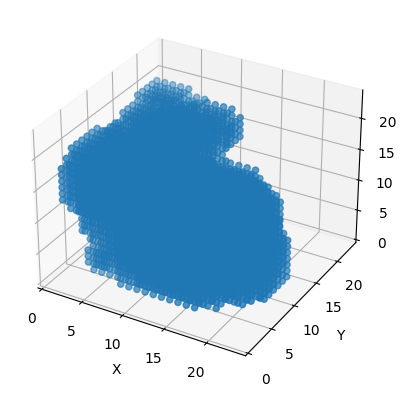

Current Loss:  0.0035949943


In [ ]:
#grid.grow(10)

3. Train:

Training Steps Completed: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Training Steps Completed: 51
Loss:
0.00233180728


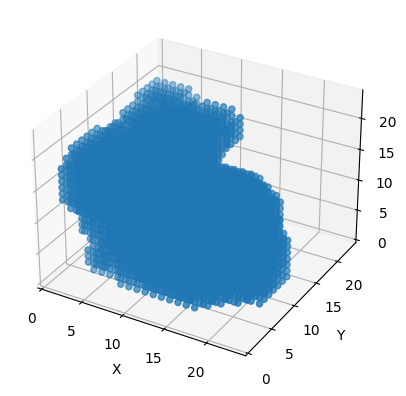

Training Steps Completed: 52
Loss:
0.00214680401


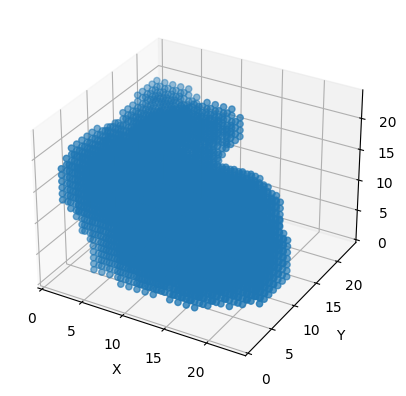

Training Steps Completed: 53
Loss:
0.00340325222


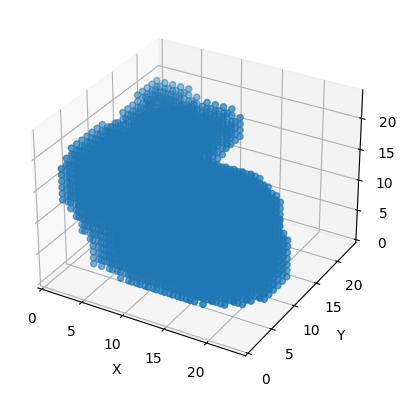

Training Steps Completed: 54
Loss:
0.0028614467


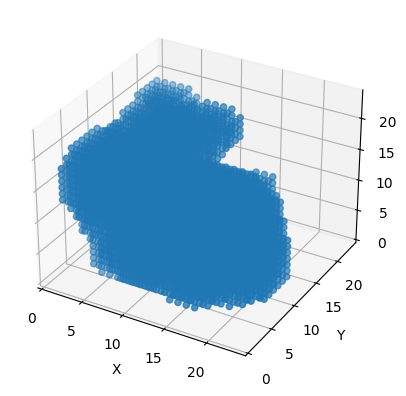

Training Steps Completed: 55
Loss:
0.0026859357


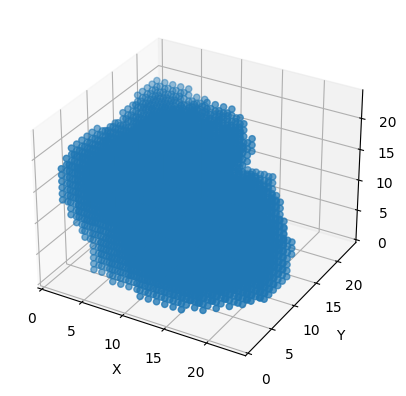

Training Steps Completed: 56
Loss:
0.00206677639


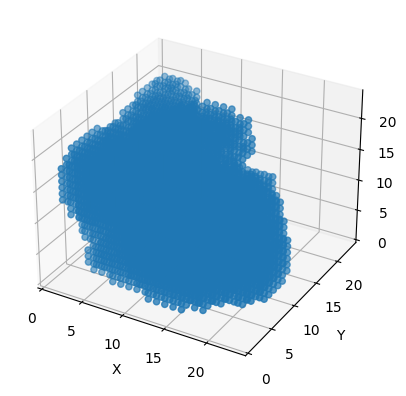

Training Steps Completed: 57
Loss:
0.00326566887


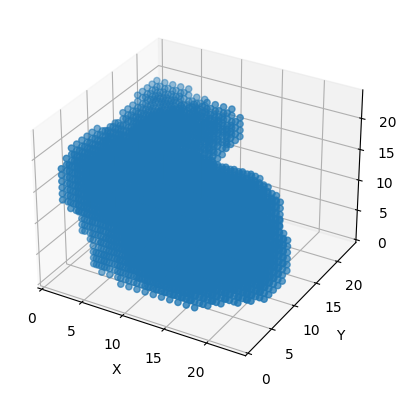

Training Steps Completed: 58
Loss:
0.00456374232


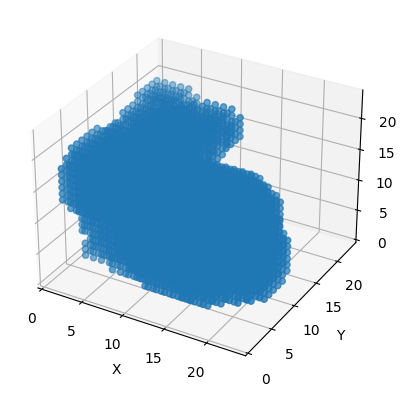

Training Steps Completed: 59
Loss:
0.00233149831


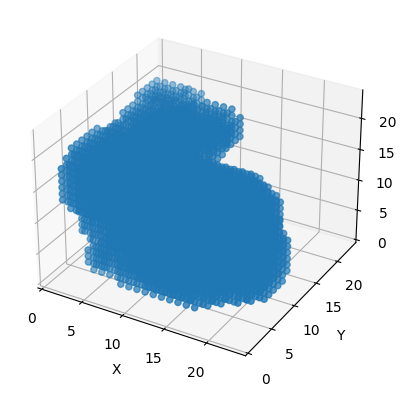

Training Steps Completed: 60
Loss:
0.0023237362


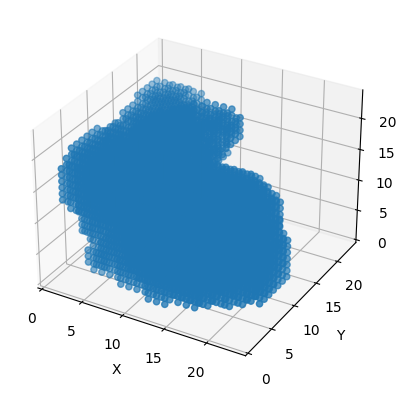

In [ ]:
#grid.train(10)

Training Steps Completed: 160


  0%|          | 0/30 [00:00<?, ?it/s]

Training Steps Completed: 161
Loss:
0.0010449253


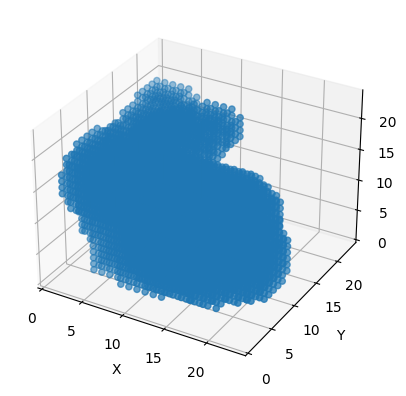

Training Steps Completed: 162
Loss:
0.00107228116


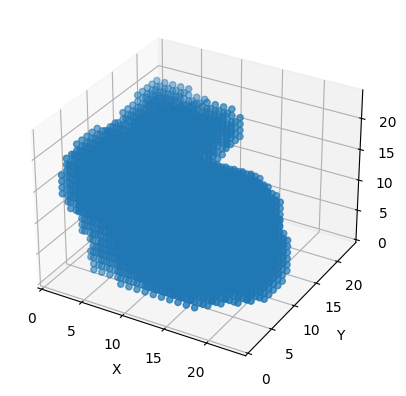

Training Steps Completed: 163
Loss:
0.00114644365


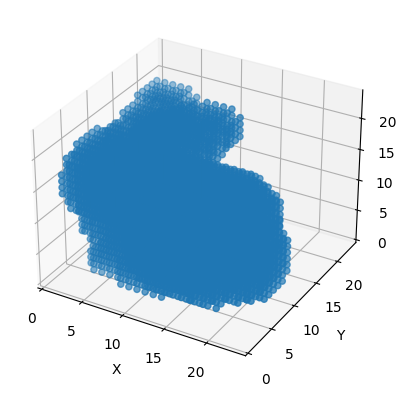

Training Steps Completed: 164
Loss:
0.00113812578


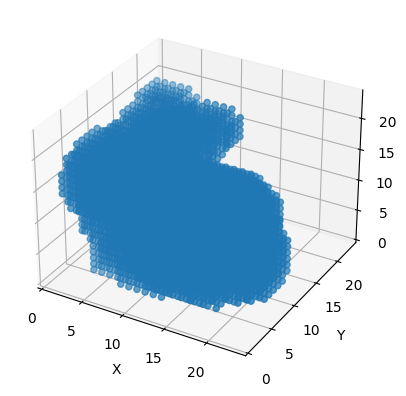

Training Steps Completed: 165
Loss:
0.000982905156


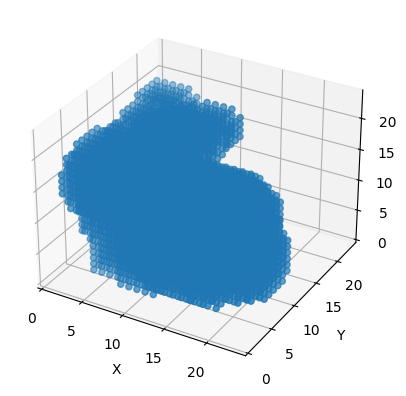

Training Steps Completed: 166
Loss:
0.000710289925


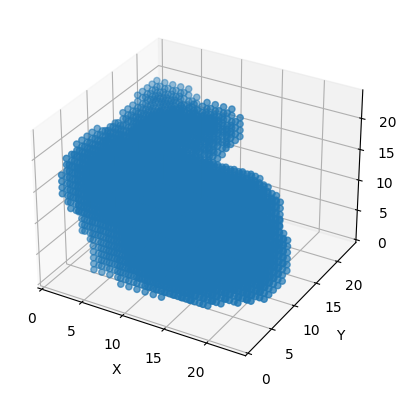

Training Steps Completed: 167
Loss:
0.00108794076


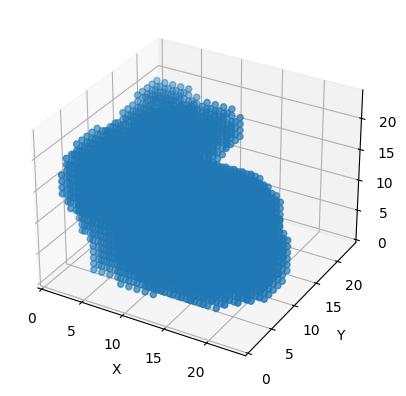

Training Steps Completed: 168
Loss:
0.00084350619


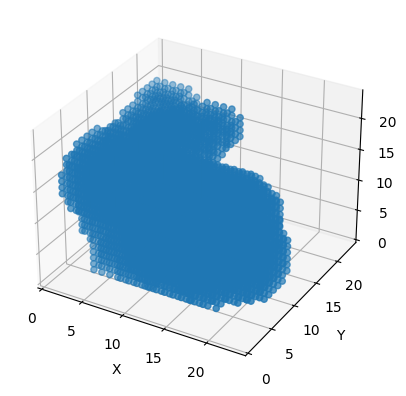

Training Steps Completed: 169
Loss:
0.000733808673


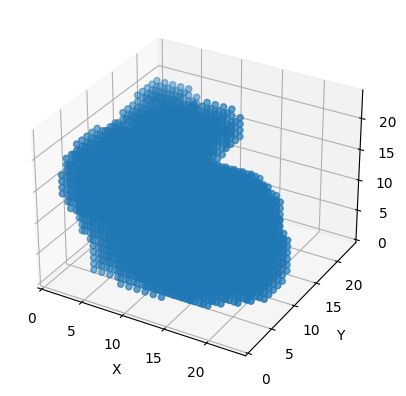

Training Steps Completed: 170
Loss:
0.000832170539


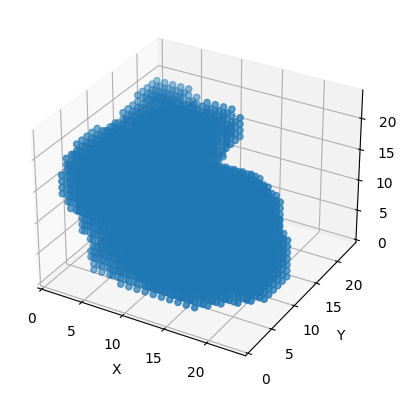

Training Steps Completed: 171
Loss:
0.000783086463


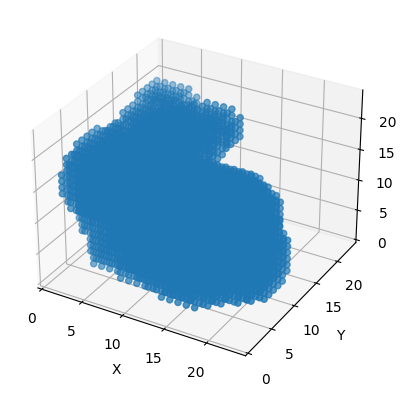

Training Steps Completed: 172
Loss:
0.00142025948


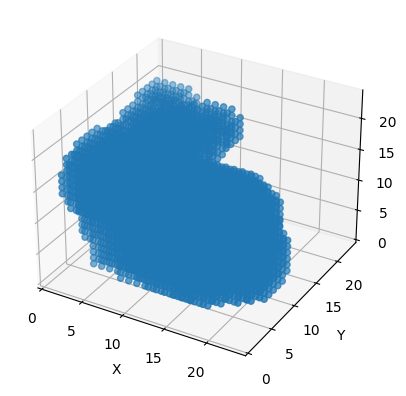

Training Steps Completed: 173
Loss:
0.000932805


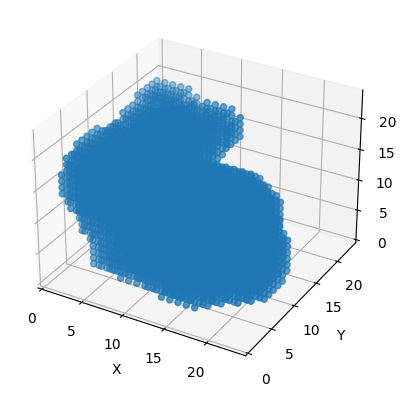

Training Steps Completed: 174
Loss:
0.00125256425


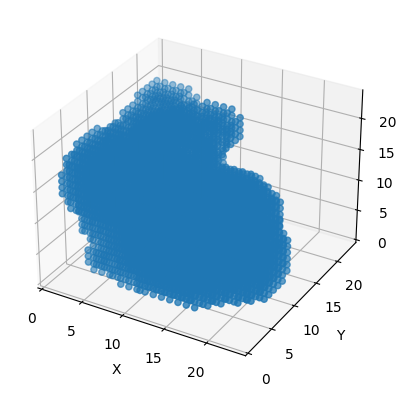

Training Steps Completed: 175
Loss:
0.00117864262


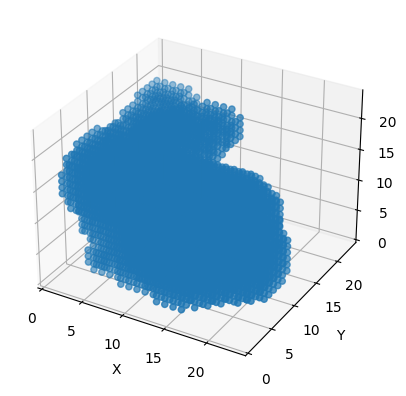

Training Steps Completed: 176
Loss:
0.000886659545


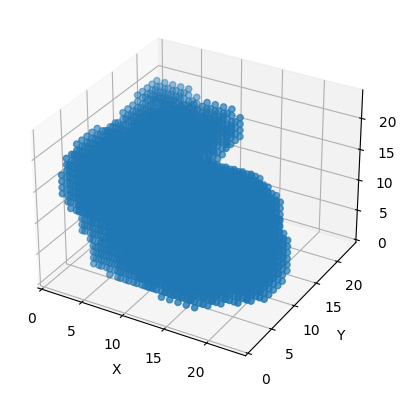

Training Steps Completed: 177
Loss:
0.00121101411


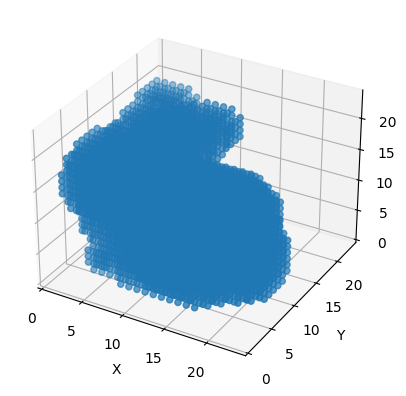

Training Steps Completed: 178
Loss:
0.000832497084


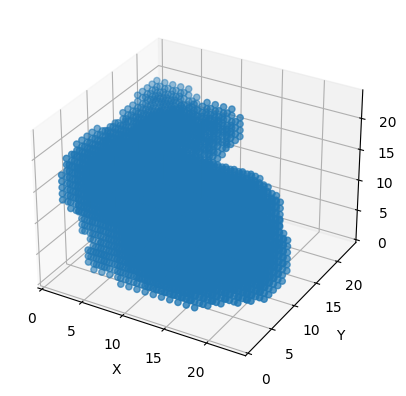

Training Steps Completed: 179
Loss:
0.00217976887


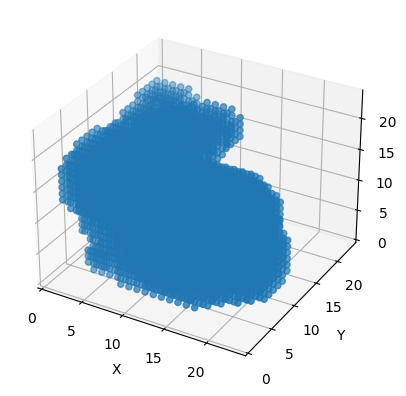

Training Steps Completed: 180
Loss:
0.002419814


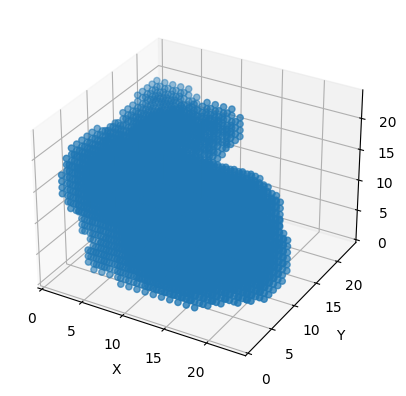

Training Steps Completed: 181
Loss:
0.00165041513


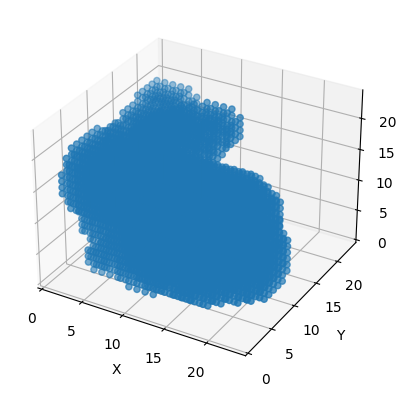

Training Steps Completed: 182
Loss:
0.0020221225


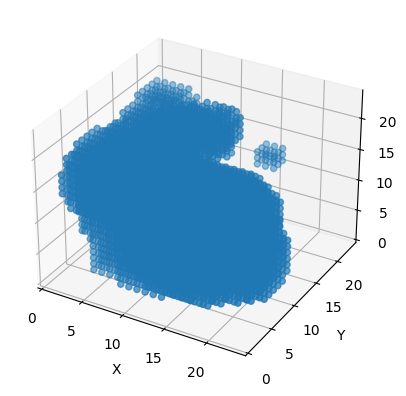

Training Steps Completed: 183
Loss:
0.0017551051


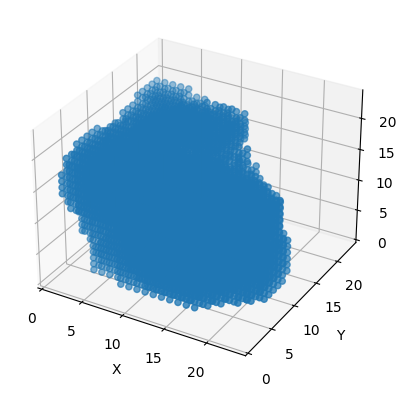

Training Steps Completed: 184
Loss:
0.0019346358


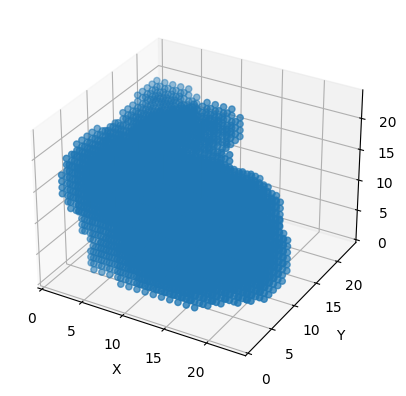

Training Steps Completed: 185
Loss:
0.00265916646


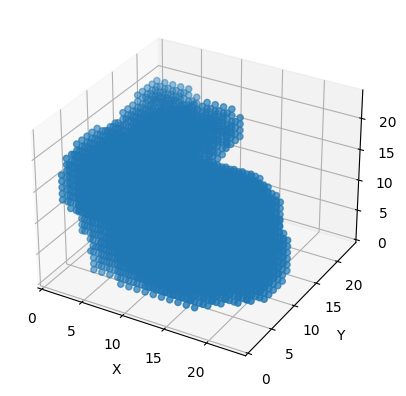

Training Steps Completed: 186
Loss:
0.00182886841


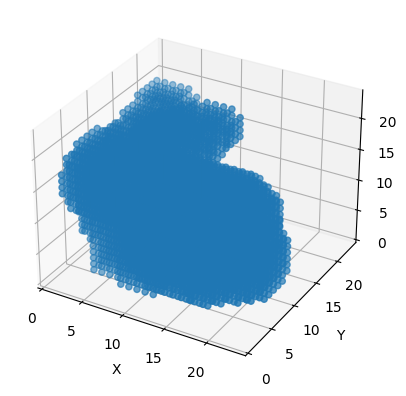

Training Steps Completed: 187
Loss:
0.00176908181


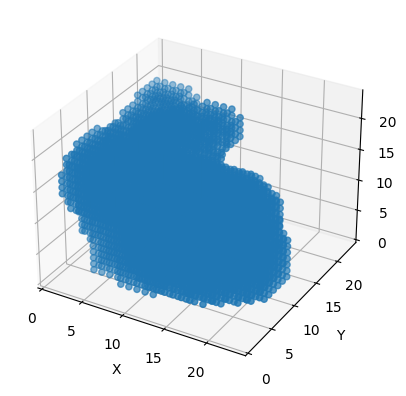

Training Steps Completed: 188
Loss:
0.00263996865


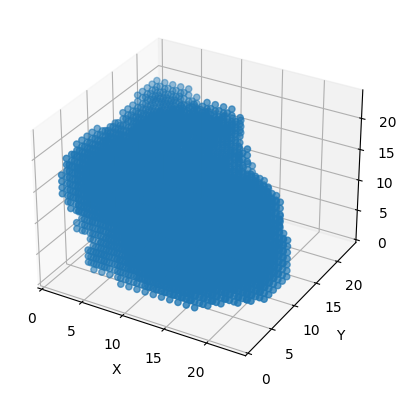

Training Steps Completed: 189
Loss:
0.00182574941


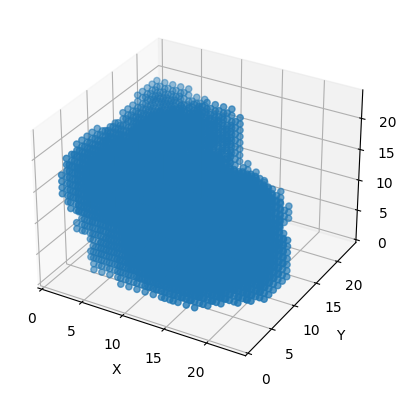

Training Steps Completed: 190
Loss:
0.00218137307


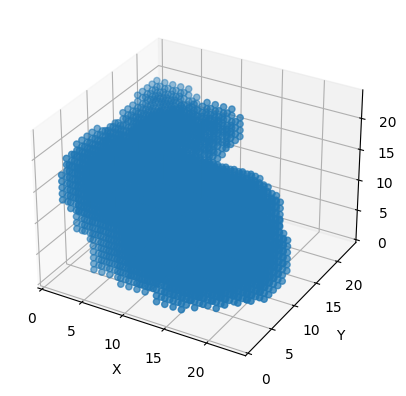

In [ ]:
#grid.train(30)

Watch it grow for n steps:<br>(If you use a number > 100, you will see the instability when it grows past the number of steps it was trained for)

To save weights:

In [ ]:
model_step.save_weights('MediumBunnyMarch19_200.h5')

To load past weights:<br>
Click the folder icon and upload the weights file to colab. Insert the path below.

In [ ]:
model_step.load_weights('/content/k3_MediumBunny_160.h5') # <- put your path here
grid = CA(target_object)

Seed Shape =  (1, 24, 24, 24, 16)
Target Shape =  (1, 24, 24, 24, 2)
Seed and target initialized


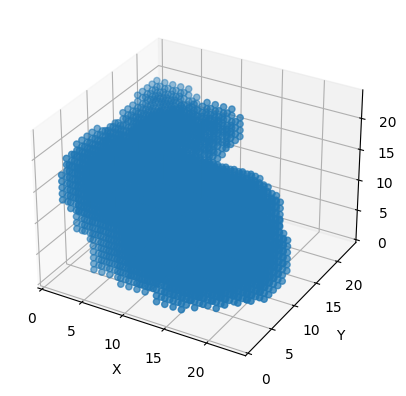

In [ ]:
visualize_3d_grid_non_interactive(grid.state_grid)

In [ ]:
visualize_3d_grid(grid.state_grid)